# CDFS-SWIRE: Validation Checks (FULL)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools

import time


In [2]:
t0 = time.time()

catname = "../../dmu1/dmu1_ml_CDFS-SWIRE/data/master_catalogue_cdfs-swire_20180221.fits"
master_catalogue = Table.read(catname)

print('Elapsed time(secs): ', time.time() - t0)

print("Number of sources in master catalogue: ", len(master_catalogue))

Elapsed time(secs):  69.66166424751282
Number of sources in master catalogue:  2168544


In [6]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

CDFS-SWIRE


In [4]:
#%%javascript
#IPython.OutputArea.auto_scroll_threshold = 9999;

In [4]:
u_bands = ["OmegaCAM u", "WFI u"]
g_bands = ["OmegaCAM g",          "GPC1 g", "DECam g"]
r_bands = ["OmegaCAM r", "WFI r", "GPC1 r", "DECam r"]
i_bands = ["OmegaCAM i", "WFI i", "GPC1 i", "DECam i"]
z_bands = ["OmegaCAM z",          "GPC1 z", "DECam z", "VISTA z"]
y_bands = [                       "GPC1 y", "DECam y", "VISTA y"]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands

ir_mags = ["VISTA J", "VISTA H", "VISTA Ks", "IRAC i1", "IRAC i2", "IRAC i3", "IRAC i4"]

all_mags = opt_mags + ir_mags

## 1/ Magnitude errors

In [5]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")


    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    #ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    #ax.get_xaxis().get_major_formatter().labelOnlyBase = False
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
    #plt.show()
        

OmegaCAM u mag (aperture)
    Error max: 22
    magerr > 10: Number of objects = 1, min mag = 26.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

OmegaCAM u mag (total)
    Error max: 23
    magerr > 10: Number of objects = 8, min mag = 26.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



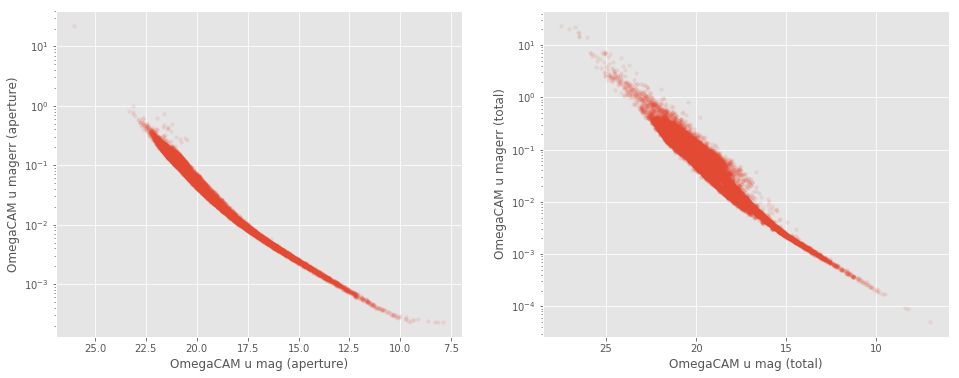

WFI u mag (aperture)
    Error max: 9243
    magerr > 10: Number of objects = 391, min mag = 29.0
    magerr > 100: Number of objects = 40, min mag = 31.7
    magerr > 1000: Number of objects = 3, min mag = 35.1

WFI u mag (total)
    no data



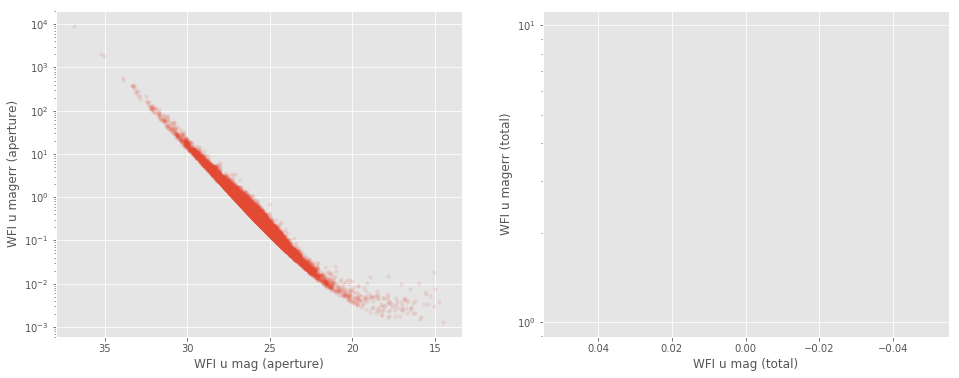

OmegaCAM g mag (aperture)
    Error max: 23
    magerr > 10: Number of objects = 1, min mag = 26.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

OmegaCAM g mag (total)
    Error max: 22
    magerr > 10: Number of objects = 5, min mag = 25.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



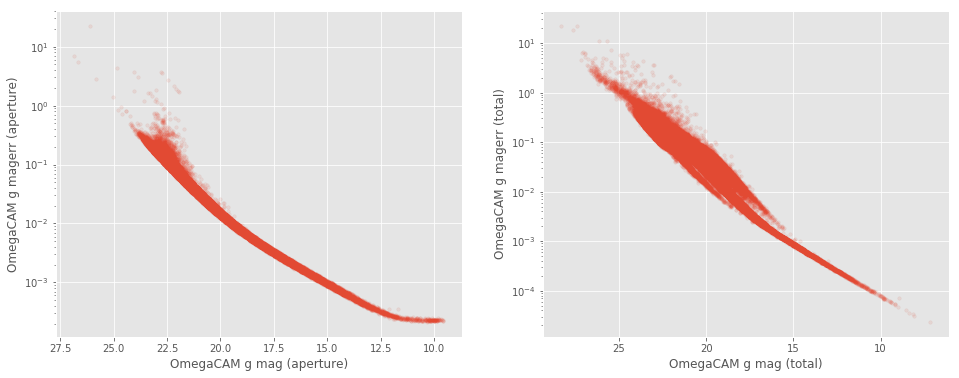

GPC1 g mag (aperture)
    Error max: 4
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 g mag (total)
    Error max: 7
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



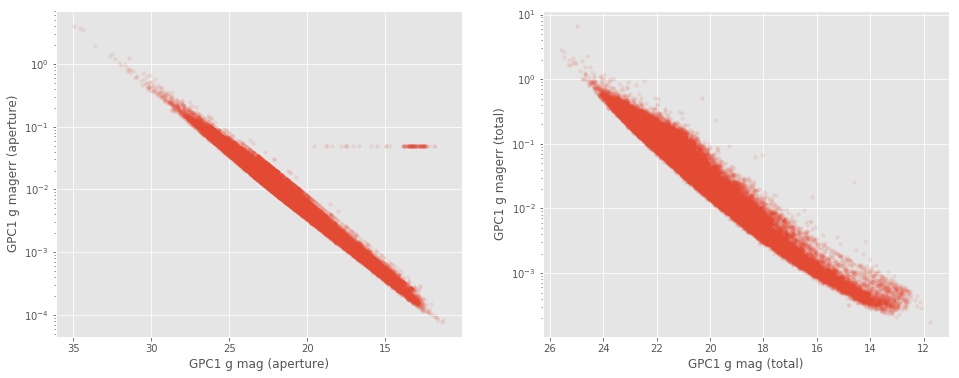

DECam g mag (aperture)
    Error max: 0
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

DECam g mag (total)
    Error max: 32534
    magerr > 10: Number of objects = 2769, min mag = 27.0
    magerr > 100: Number of objects = 229, min mag = 30.6
    magerr > 1000: Number of objects = 22, min mag = 33.3



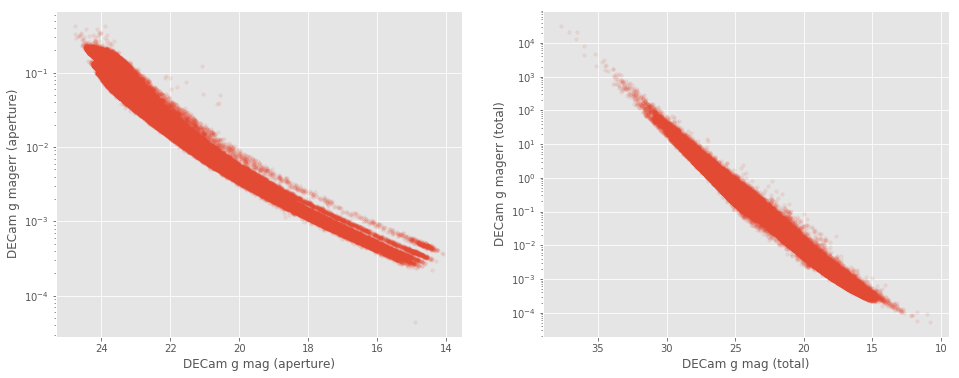

OmegaCAM r mag (aperture)
    Error max: 82
    magerr > 10: Number of objects = 5, min mag = 25.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

OmegaCAM r mag (total)
    Error max: 99
    magerr > 10: Number of objects = 16, min mag = 26.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



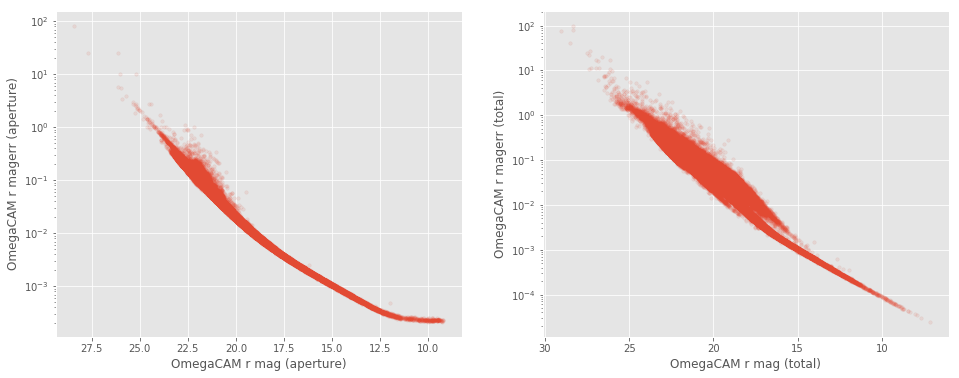

WFI r mag (aperture)
    Error max: 153
    magerr > 10: Number of objects = 13, min mag = 30.6
    magerr > 100: Number of objects = 2, min mag = 33.0
    magerr > 1000: Number of objects = 0, min mag = nan

WFI r mag (total)
    Error max: 0
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



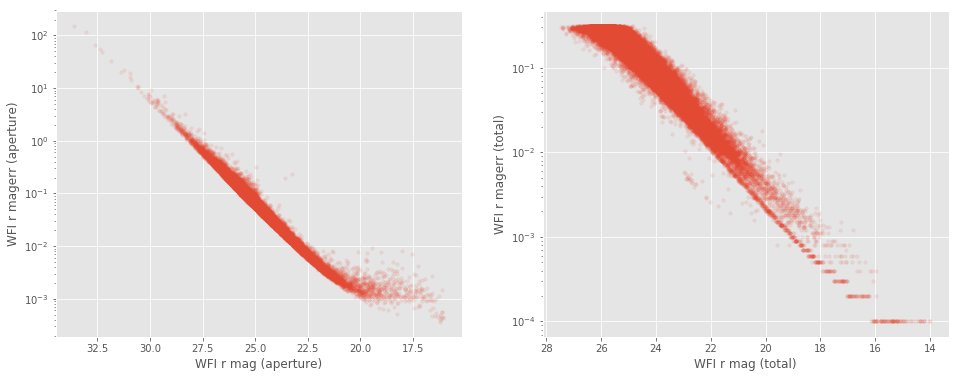

GPC1 r mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 r mag (total)
    Error max: 6
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



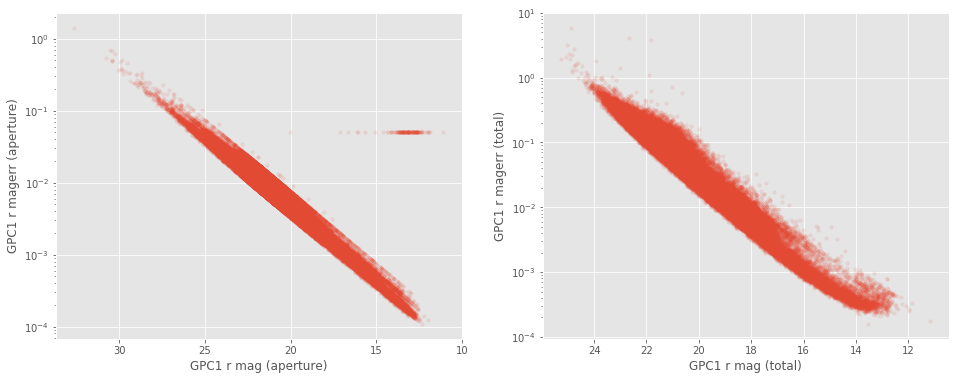

DECam r mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

DECam r mag (total)
    Error max: 78502
    magerr > 10: Number of objects = 247, min mag = 27.8
    magerr > 100: Number of objects = 27, min mag = 30.5
    magerr > 1000: Number of objects = 5, min mag = 33.1



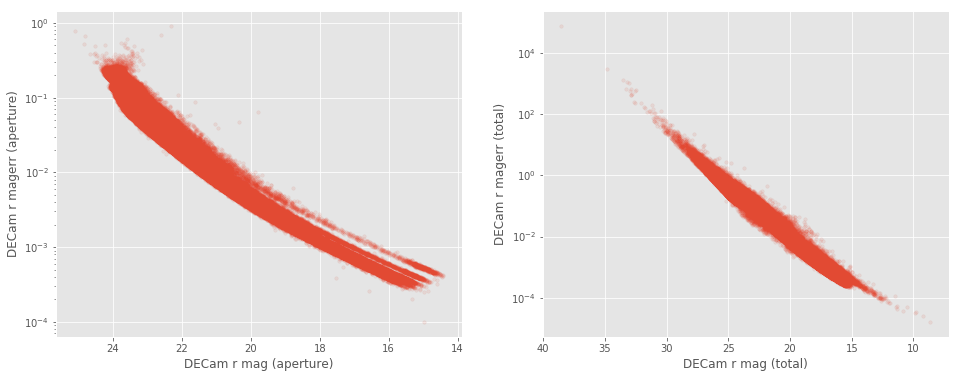

OmegaCAM i mag (aperture)
    Error max: 36
    magerr > 10: Number of objects = 1, min mag = 27.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

OmegaCAM i mag (total)
    Error max: 187
    magerr > 10: Number of objects = 14, min mag = 24.8
    magerr > 100: Number of objects = 4, min mag = 28.5
    magerr > 1000: Number of objects = 0, min mag = nan



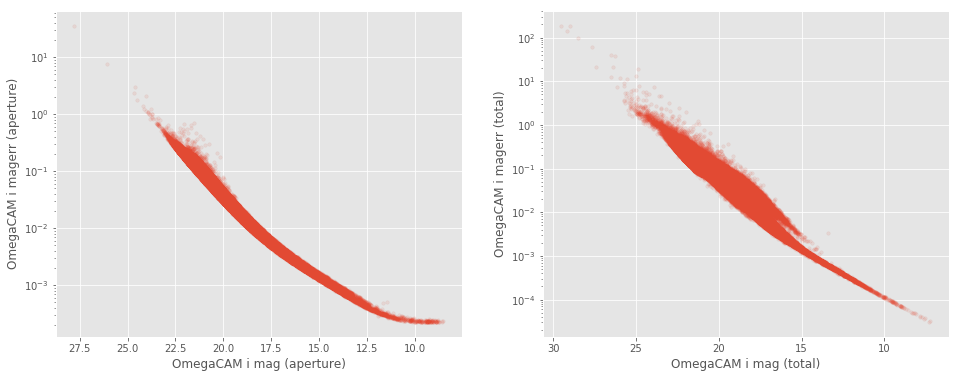

WFI i mag (aperture)
    Error max: 5273
    magerr > 10: Number of objects = 754, min mag = 27.1
    magerr > 100: Number of objects = 66, min mag = 29.7
    magerr > 1000: Number of objects = 11, min mag = 32.5

WFI i mag (total)
    no data



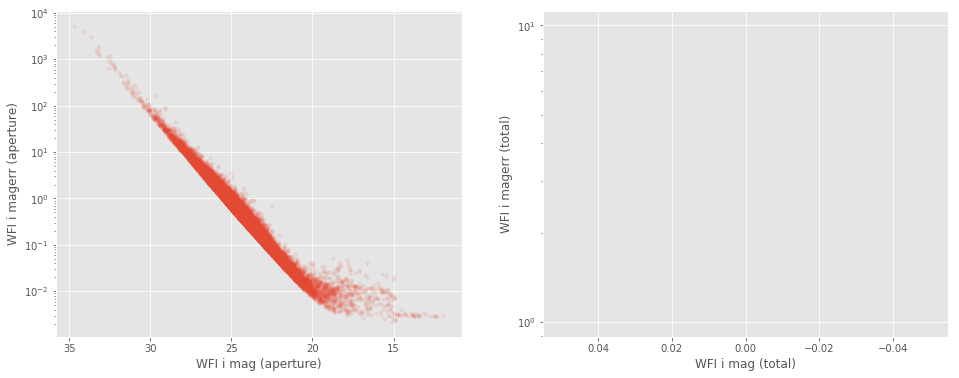

GPC1 i mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 i mag (total)
    Error max: 14
    magerr > 10: Number of objects = 1, min mag = 26.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



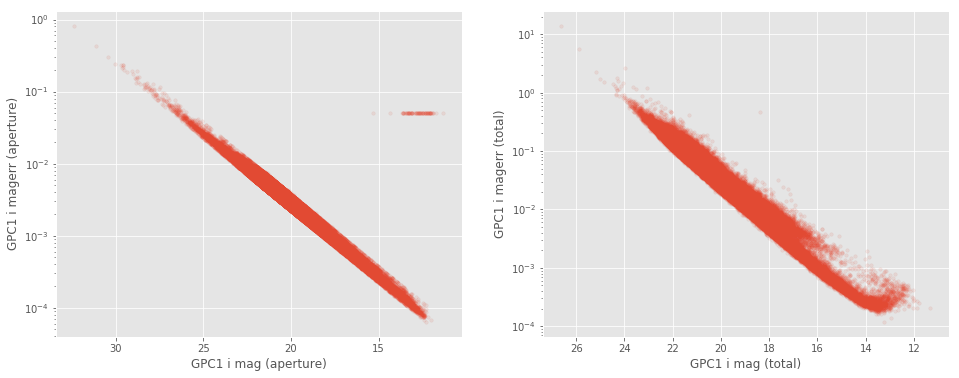

DECam i mag (aperture)
    Error max: 3
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

DECam i mag (total)
    Error max: 115243
    magerr > 10: Number of objects = 312, min mag = 25.7
    magerr > 100: Number of objects = 27, min mag = 29.9
    magerr > 1000: Number of objects = 5, min mag = 32.3



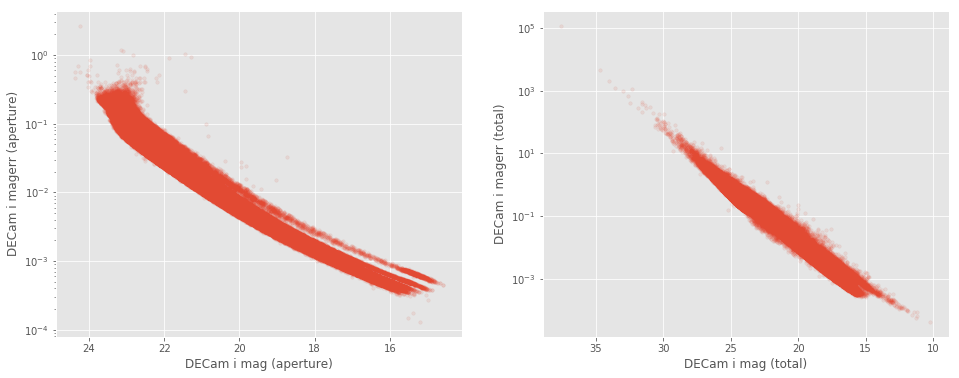

OmegaCAM z mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

OmegaCAM z mag (total)
    Error max: 98
    magerr > 10: Number of objects = 7, min mag = 24.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



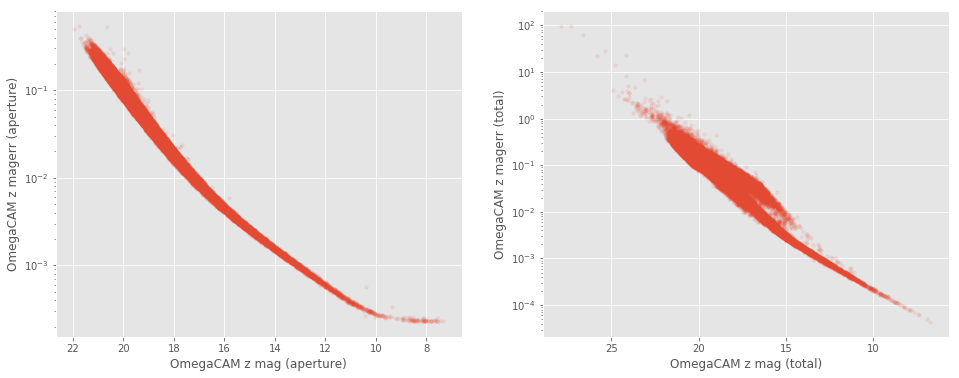

GPC1 z mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 z mag (total)
    Error max: 3
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



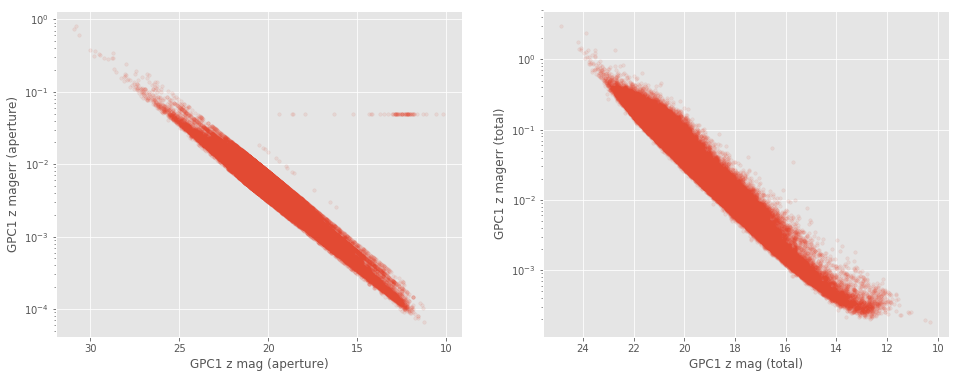

DECam z mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

DECam z mag (total)
    Error max: 12111
    magerr > 10: Number of objects = 2940, min mag = 26.0
    magerr > 100: Number of objects = 267, min mag = 28.4
    magerr > 1000: Number of objects = 29, min mag = 31.9



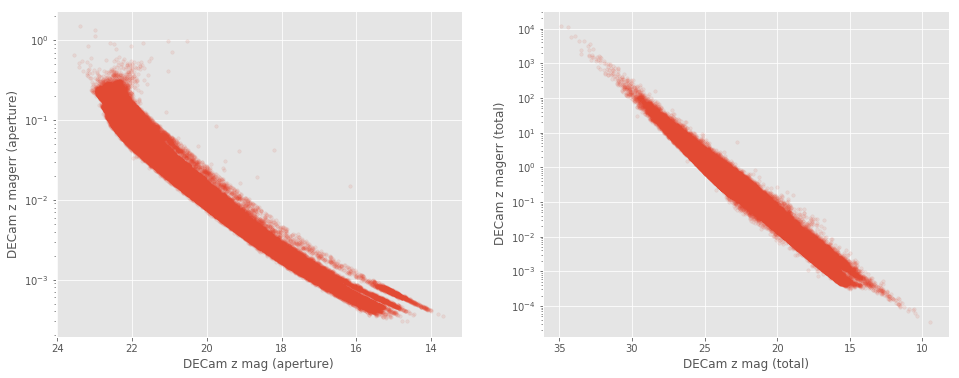

VISTA z mag (aperture)
    Error max: 75921
    magerr > 10: Number of objects = 2214, min mag = 24.5
    magerr > 100: Number of objects = 204, min mag = 30.2
    magerr > 1000: Number of objects = 20, min mag = 33.2

VISTA z mag (total)
    Error max: 21432
    magerr > 10: Number of objects = 4614, min mag = 24.3
    magerr > 100: Number of objects = 383, min mag = 29.6
    magerr > 1000: Number of objects = 34, min mag = 32.6



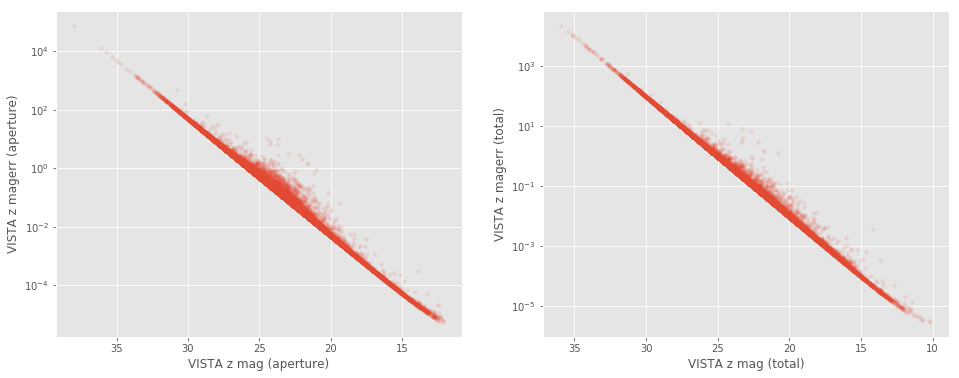

GPC1 y mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 y mag (total)
    Error max: 9
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



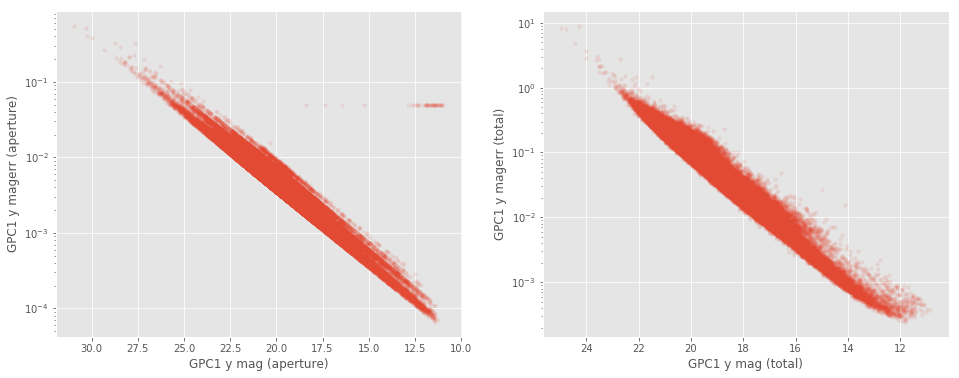

DECam y mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

DECam y mag (total)
    Error max: 387309
    magerr > 10: Number of objects = 19886, min mag = 24.3
    magerr > 100: Number of objects = 1954, min mag = 26.6
    magerr > 1000: Number of objects = 183, min mag = 30.0



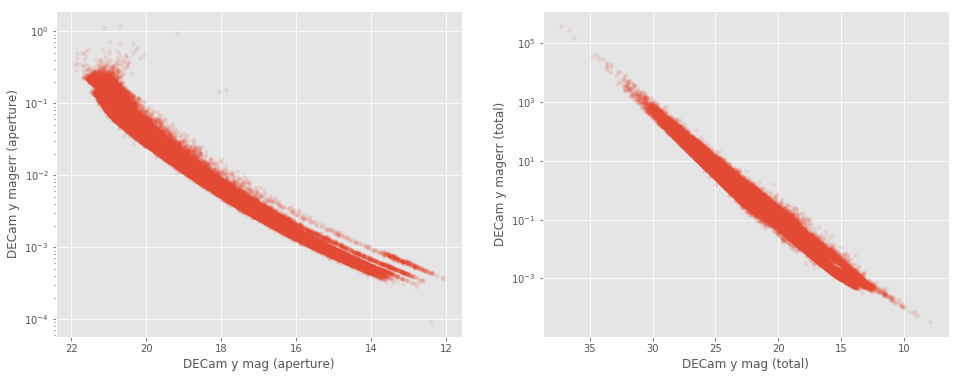

VISTA y mag (aperture)
    Error max: 19262
    magerr > 10: Number of objects = 1825, min mag = 21.0
    magerr > 100: Number of objects = 117, min mag = 22.8
    magerr > 1000: Number of objects = 11, min mag = 25.1

VISTA y mag (total)
    Error max: 19262
    magerr > 10: Number of objects = 2955, min mag = 25.2
    magerr > 100: Number of objects = 227, min mag = 30.1
    magerr > 1000: Number of objects = 16, min mag = 32.6



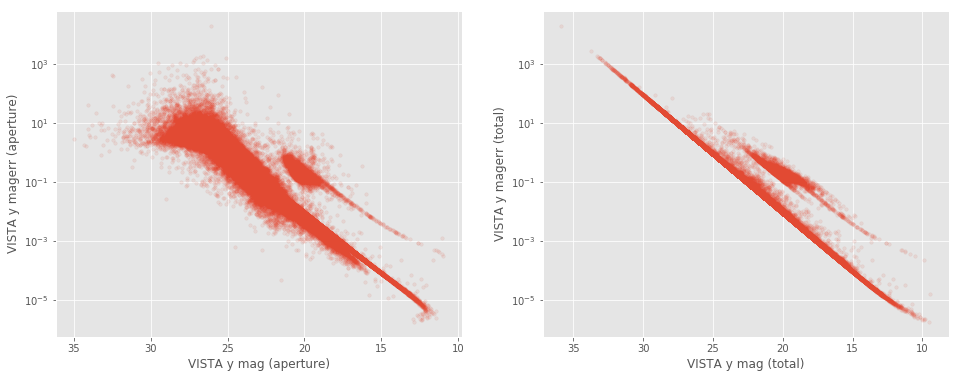

VISTA J mag (aperture)
    Error max: 13310
    magerr > 10: Number of objects = 2346, min mag = 20.2
    magerr > 100: Number of objects = 170, min mag = 21.8
    magerr > 1000: Number of objects = 12, min mag = 25.3

VISTA J mag (total)
    Error max: 22500
    magerr > 10: Number of objects = 3966, min mag = 24.1
    magerr > 100: Number of objects = 323, min mag = 28.4
    magerr > 1000: Number of objects = 23, min mag = 32.3



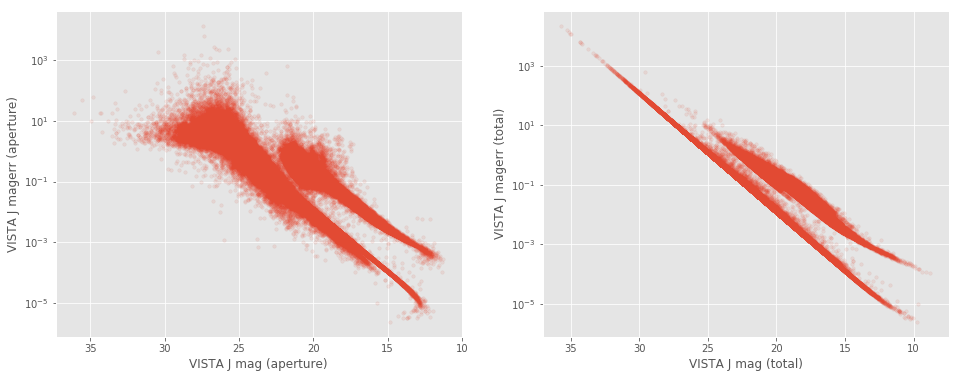

VISTA H mag (aperture)
    Error max: 53692
    magerr > 10: Number of objects = 6578, min mag = 19.7
    magerr > 100: Number of objects = 457, min mag = 23.6
    magerr > 1000: Number of objects = 45, min mag = 23.6

VISTA H mag (total)
    Error max: 53692
    magerr > 10: Number of objects = 11727, min mag = 23.5
    magerr > 100: Number of objects = 934, min mag = 29.2
    magerr > 1000: Number of objects = 90, min mag = 31.7



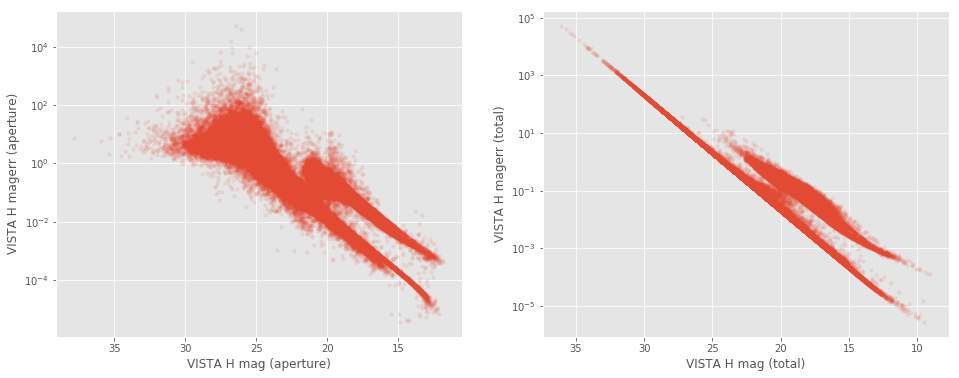

VISTA Ks mag (aperture)
    Error max: 35088
    magerr > 10: Number of objects = 9947, min mag = 20.3
    magerr > 100: Number of objects = 664, min mag = 20.3
    magerr > 1000: Number of objects = 65, min mag = 20.3

VISTA Ks mag (total)
    Error max: 332353
    magerr > 10: Number of objects = 17614, min mag = 24.1
    magerr > 100: Number of objects = 1487, min mag = 27.5
    magerr > 1000: Number of objects = 140, min mag = 29.2



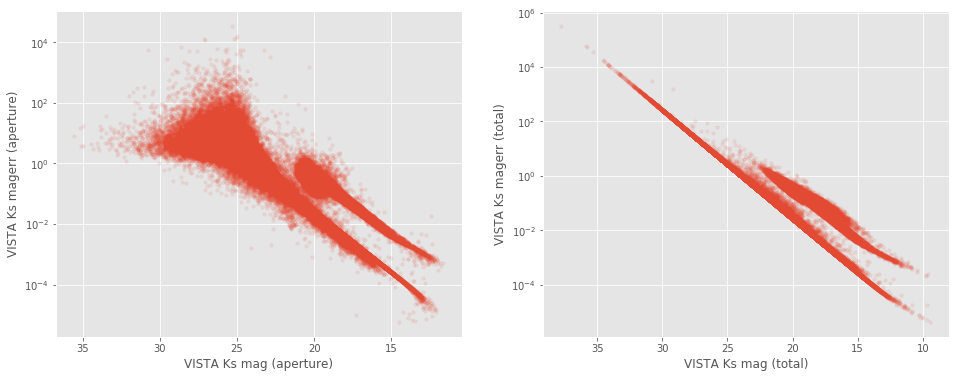

IRAC i1 mag (aperture)
    Error max: 42761
    magerr > 10: Number of objects = 704, min mag = 18.2
    magerr > 100: Number of objects = 67, min mag = 22.4
    magerr > 1000: Number of objects = 5, min mag = 27.4

IRAC i1 mag (total)
    Error max: 4733
    magerr > 10: Number of objects = 700, min mag = 16.7
    magerr > 100: Number of objects = 47, min mag = 20.3
    magerr > 1000: Number of objects = 3, min mag = 32.4



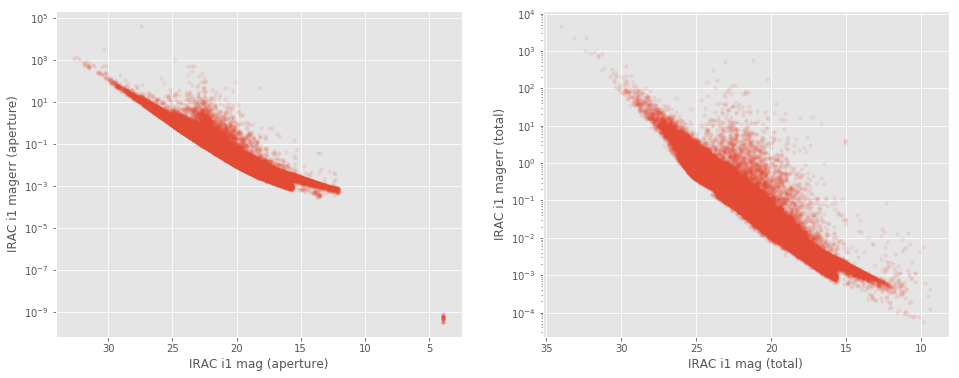

IRAC i2 mag (aperture)
    Error max: 46327
    magerr > 10: Number of objects = 1098, min mag = 18.4
    magerr > 100: Number of objects = 92, min mag = 19.9
    magerr > 1000: Number of objects = 12, min mag = 22.1

IRAC i2 mag (total)
    Error max: 23790
    magerr > 10: Number of objects = 677, min mag = 17.5
    magerr > 100: Number of objects = 78, min mag = 18.2
    magerr > 1000: Number of objects = 14, min mag = 22.5



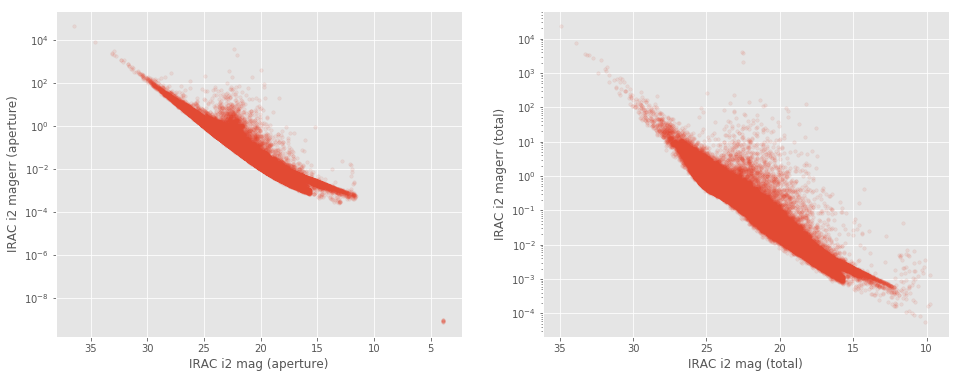

IRAC i3 mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i3 mag (total)
    Error max: 3
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



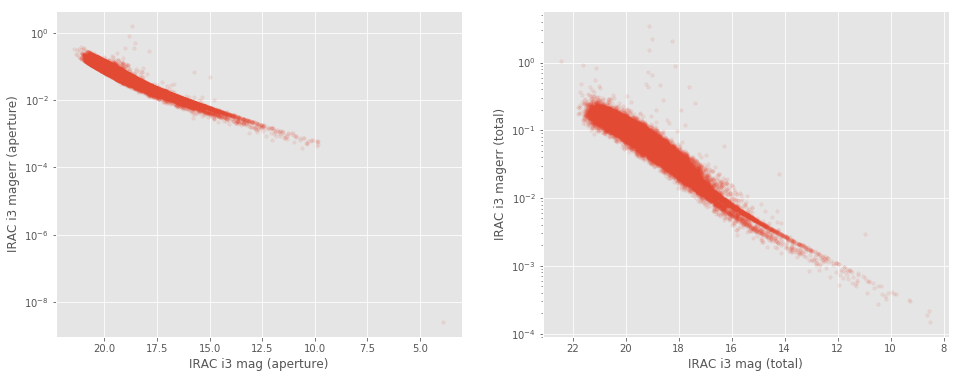

IRAC i4 mag (aperture)
    Error max: 3
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i4 mag (total)
    Error max: 3
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



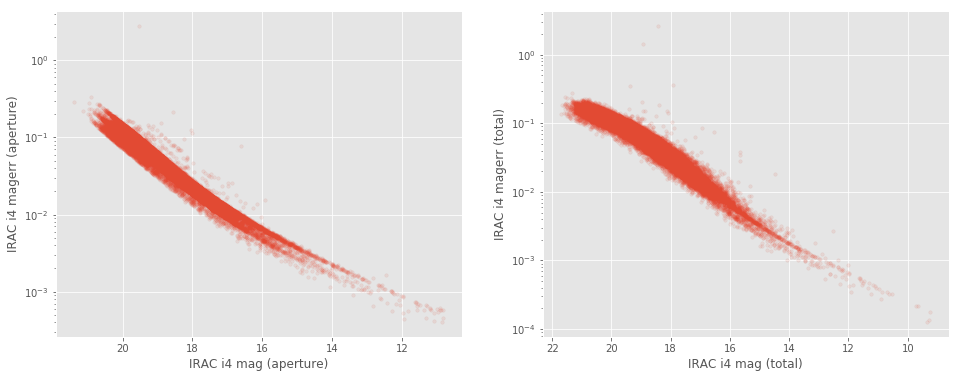

In [7]:
for mag in all_mags:
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "vista_z":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2/ Magnitude and error issues

In [12]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None, mask3=None,
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2 or (nb == 1 and x3 is None):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None and nb >= 2:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    ### IRAC only ###
    if nb == 1:
        # IRAC mag
        ax2.set_yscale('log')    # to place before scatter to avoid issues
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask2], y2[mask2], 'b.')
        ax2.invert_xaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
        
    if nb == 1 and x3 is not None:
        # IRAC mag with i3
        ax3.set_yscale('log')    # to place before scatter to avoid issues
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask3], y3[mask3], 'b.')
        ax3.invert_xaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    ###          ###
    
    # Comparing magnitudes
    if nb >= 2:
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask], y2[mask], 'b.')
        if mask2 is not None:
            ax2.plot(x2[mask2], y2[mask2], 'g.')
        ax2.invert_xaxis()
        ax2.invert_yaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        elif "IRAC" in labels1[0]:
            figname = field + "_iracIssues_i1_i2.png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()

### 2.a Pan-STARRS Aperture magnitude

GPC1 g
   Number of flagged objects: 103


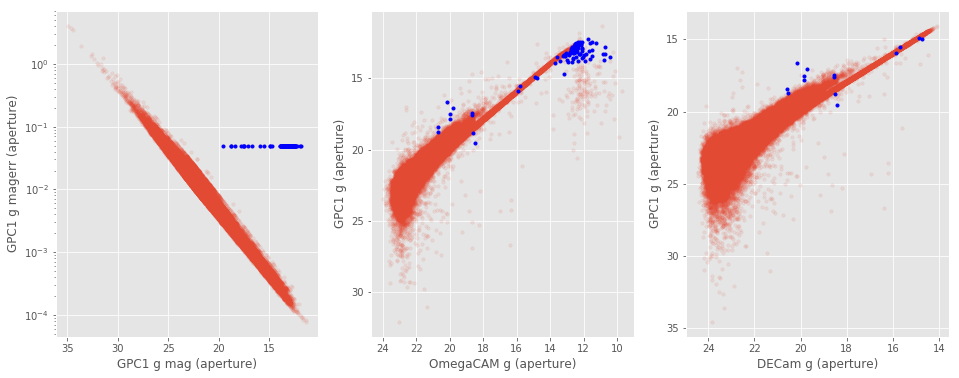

GPC1 r
   Number of flagged objects: 120


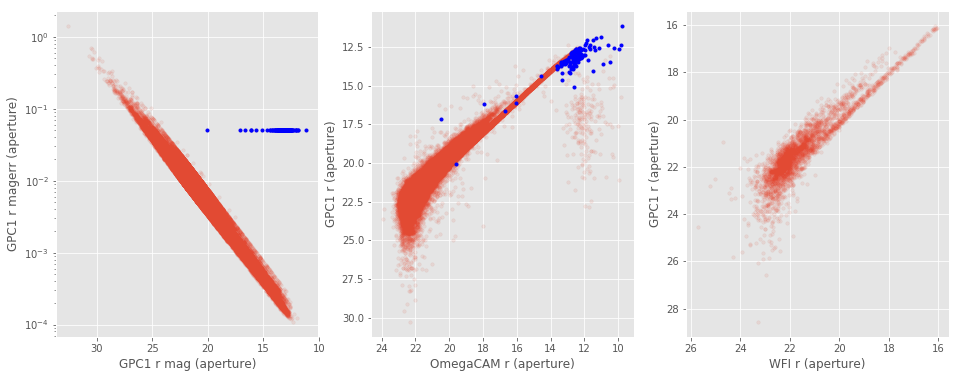

GPC1 i
   Number of flagged objects: 78


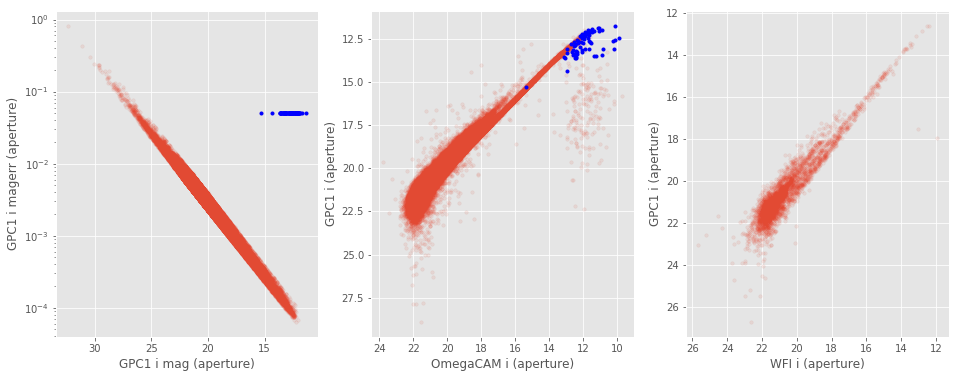

GPC1 z
   Number of flagged objects: 67


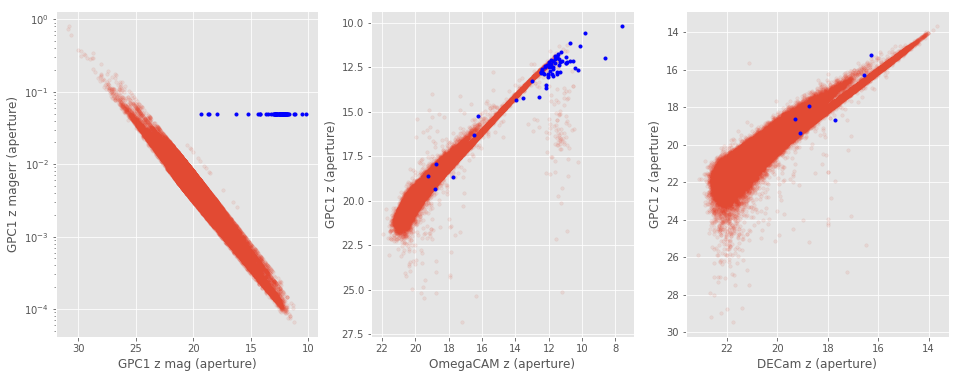

GPC1 y
   Number of flagged objects: 42


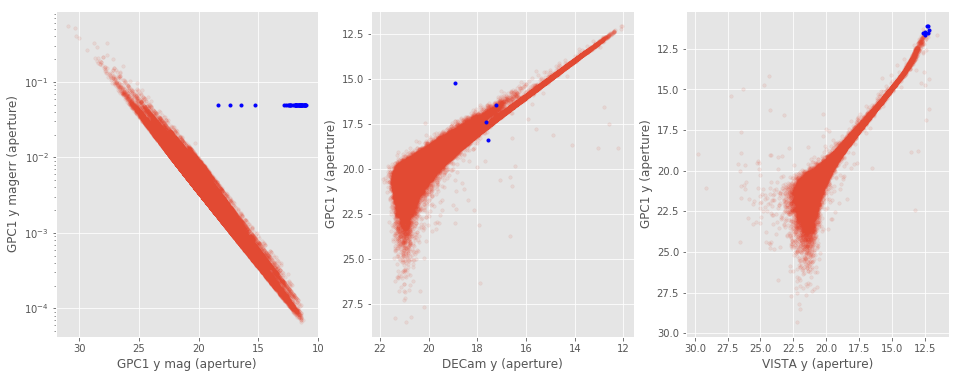

In [10]:
## Pan-STARRS stack cat 
ps1_err = 0.05000000074505806

bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_g':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)    
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.c IRAC Aperture magnitude

IRAC i1: Number of flagged objects: 32
IRAC i2: Number of flagged objects: 9
IRAC i3: Number of flagged objects: 1


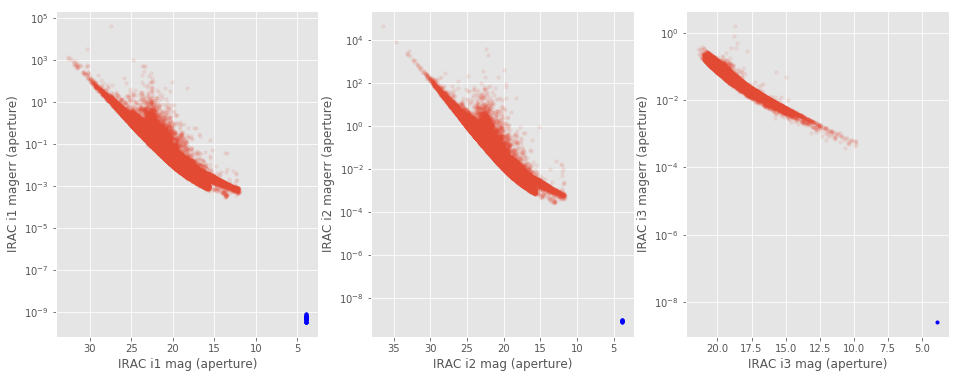

In [13]:
irac_mag = 3.9000000001085695

bands = ['IRAC i1', 'IRAC i2', 'IRAC i3']
    
basecol1, basecol2, basecol3 = bands[0].replace(" ", "_").lower(), bands[1].replace(" ", "_").lower(), bands[2].replace(" ", "_").lower()
col1, col2, col3 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2), "m_ap_{}".format(basecol3)
ecol1, ecol2, ecol3 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2), "merr_ap_{}".format(basecol3)
    
mask1 = np.where(master_catalogue[col1] == irac_mag)[0]   
print ('IRAC i1: Number of flagged objects:', len(master_catalogue[col1][mask1]))

mask2 = np.where(master_catalogue[col2] == irac_mag)[0]  
print ('IRAC i2: Number of flagged objects:', len(master_catalogue[col2][mask2]))

mask3 = np.where(master_catalogue[col3] == irac_mag)[0]  
print ('IRAC i3: Number of flagged objects:', len(master_catalogue[col3][mask3]))

flag_mag(mask1, master_catalogue[col1], master_catalogue[ecol1],
         master_catalogue[col2], master_catalogue[ecol2], mask2=mask2,
         x3=master_catalogue[col3], y3=master_catalogue[ecol3], mask3=mask3,
         labels1=("{} mag (aperture)".format(bands[0]), "{} magerr (aperture)".format(bands[0])),
         labels2=("{} mag (aperture)".format(bands[1]), "{} magerr (aperture)".format(bands[1])),
         labels3=("{} mag (aperture)".format(bands[2]), "{} magerr (aperture)".format(bands[2])),
         nb=1, savefig=True)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 5\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [12]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

WFI u (aperture) - OmegaCAM u (aperture) (295 sources):
- Median: 0.30
- Median Absolute Deviation: 0.07
- 1% percentile: 0.026031494140625
- 99% percentile: 5.898116226196289
Outliers separation: log(chi2) = 6.81
Number of outliers: 0



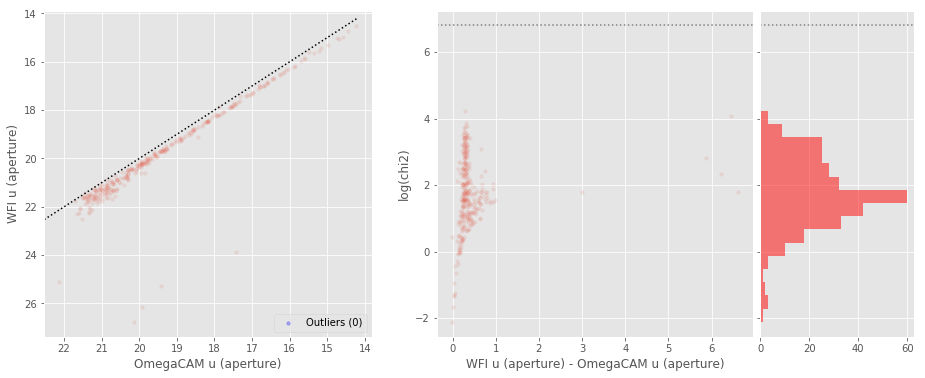

No sources have both OmegaCAM u (total) and WFI u (total) values.

OmegaCAM g (aperture) - GPC1 g (aperture) (97640 sources):
- Median: 0.30
- Median Absolute Deviation: 0.27
- 1% percentile: -1.4628313636779784
- 99% percentile: 1.4779336547851563
Outliers separation: log(chi2) = 6.66
Number of outliers: 107



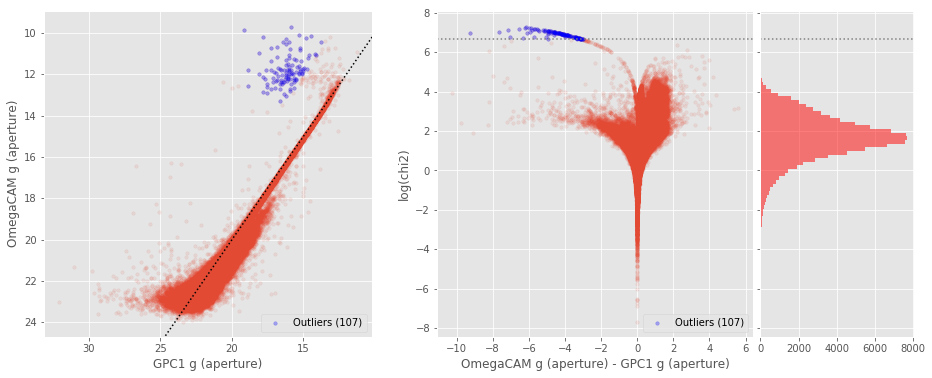

OmegaCAM g (total) - GPC1 g (total) (90224 sources):
- Median: 0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -0.7950097846984863
- 99% percentile: 1.2966886329650893
Outliers separation: log(chi2) = 5.31
Number of outliers: 137



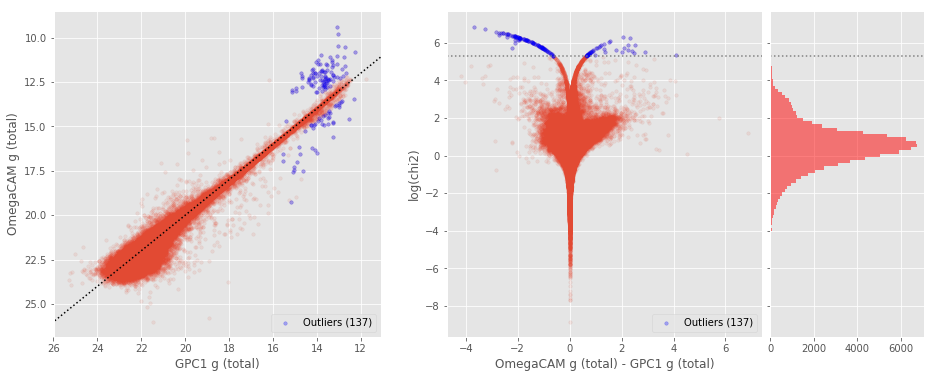

DECam g (aperture) - GPC1 g (aperture) (140331 sources):
- Median: 0.31
- Median Absolute Deviation: 0.33
- 1% percentile: -2.0128673553466796
- 99% percentile: 1.5610710144042974
Outliers separation: log(chi2) = 6.95
Number of outliers: 0



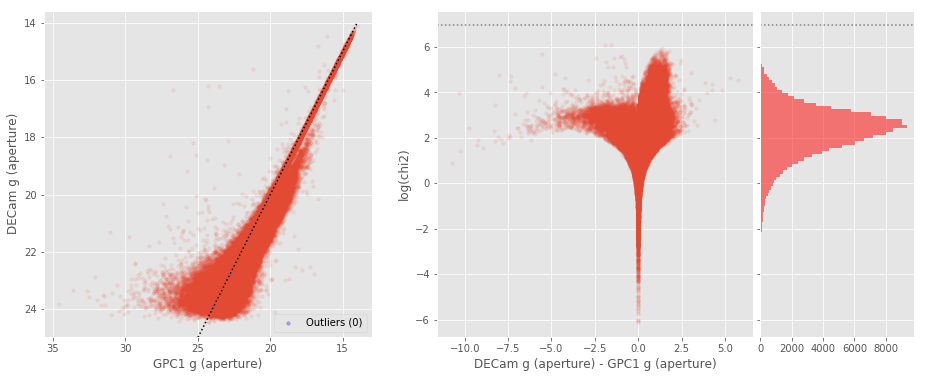

DECam g (total) - GPC1 g (total) (110788 sources):
- Median: -0.00
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8025470733642578
- 99% percentile: 2.3840057277679465
Outliers separation: log(chi2) = 5.04
Number of outliers: 1417



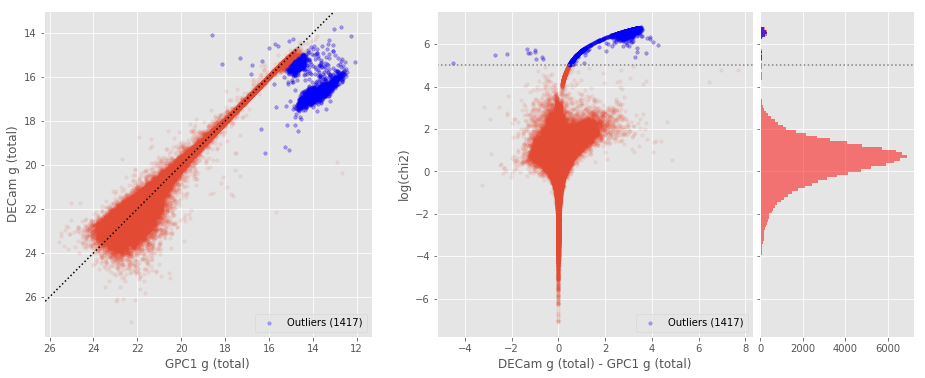

DECam g (aperture) - OmegaCAM g (aperture) (111460 sources):
- Median: -0.04
- Median Absolute Deviation: 0.08
- 1% percentile: -0.36706384658813473
- 99% percentile: 0.40462675094604555
Outliers separation: log(chi2) = 5.41
Number of outliers: 6



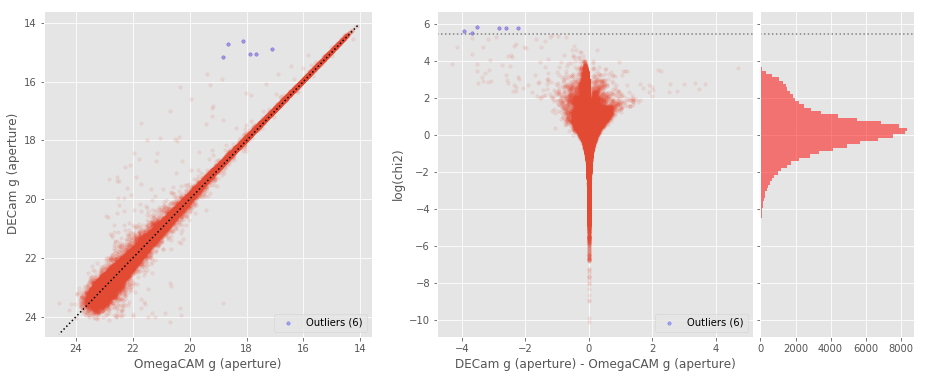

DECam g (total) - OmegaCAM g (total) (114078 sources):
- Median: -0.10
- Median Absolute Deviation: 0.13
- 1% percentile: -1.087312183380127
- 99% percentile: 2.6726785278320295
Outliers separation: log(chi2) = 5.12
Number of outliers: 1683



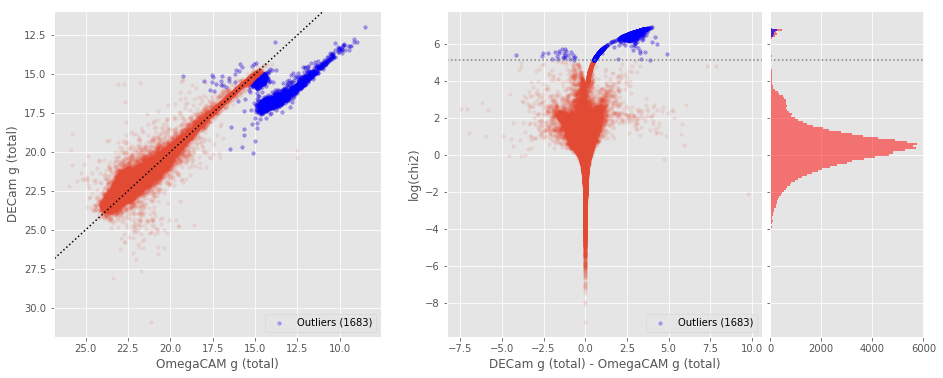

OmegaCAM r (aperture) - GPC1 r (aperture) (137229 sources):
- Median: 0.16
- Median Absolute Deviation: 0.22
- 1% percentile: -1.229357147216797
- 99% percentile: 1.0721257781982423
Outliers separation: log(chi2) = 6.09
Number of outliers: 192



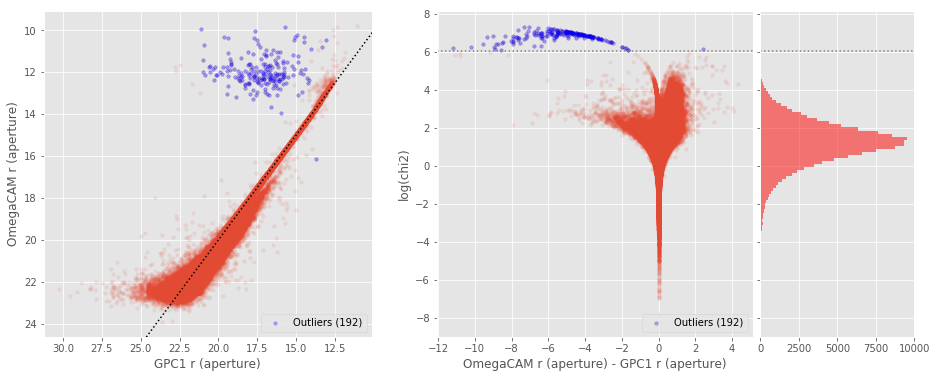

OmegaCAM r (total) - GPC1 r (total) (131220 sources):
- Median: -0.08
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0283002471923828
- 99% percentile: 0.922282371520996
Outliers separation: log(chi2) = 5.31
Number of outliers: 102



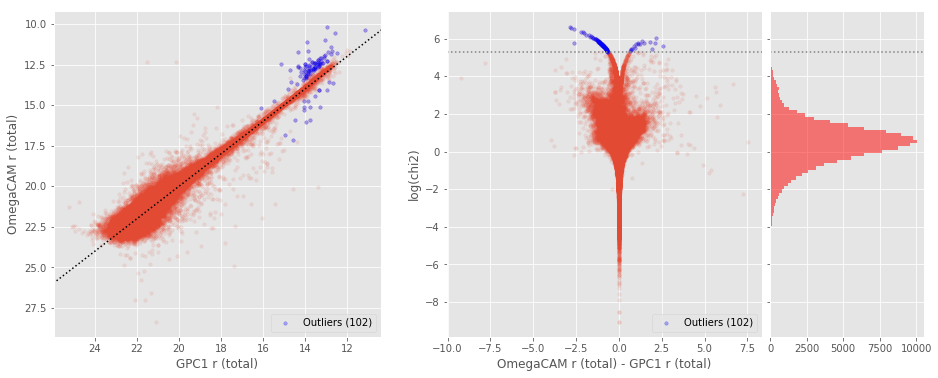

WFI r (aperture) - GPC1 r (aperture) (3121 sources):
- Median: 0.25
- Median Absolute Deviation: 0.34
- 1% percentile: -1.7204780578613281
- 99% percentile: 1.3797206878662118
Outliers separation: log(chi2) = 7.40
Number of outliers: 0



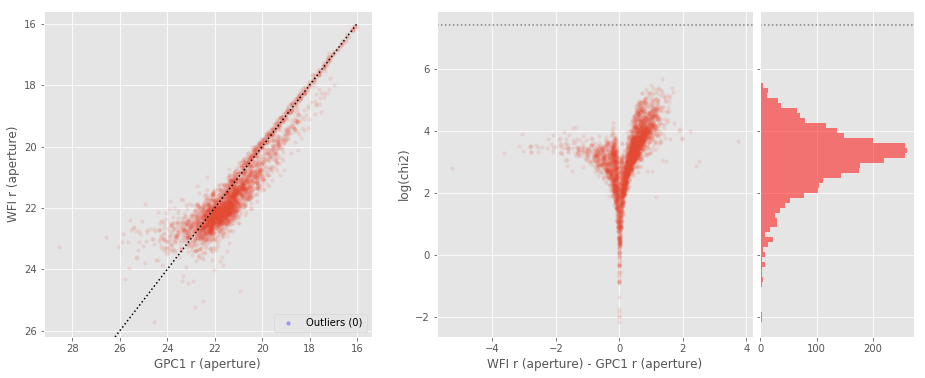

WFI r (total) - GPC1 r (total) (2939 sources):
- Median: -0.34
- Median Absolute Deviation: 0.14
- 1% percentile: -1.258667984008789
- 99% percentile: 0.4819207382202131
Outliers separation: log(chi2) = 6.20
Number of outliers: 0



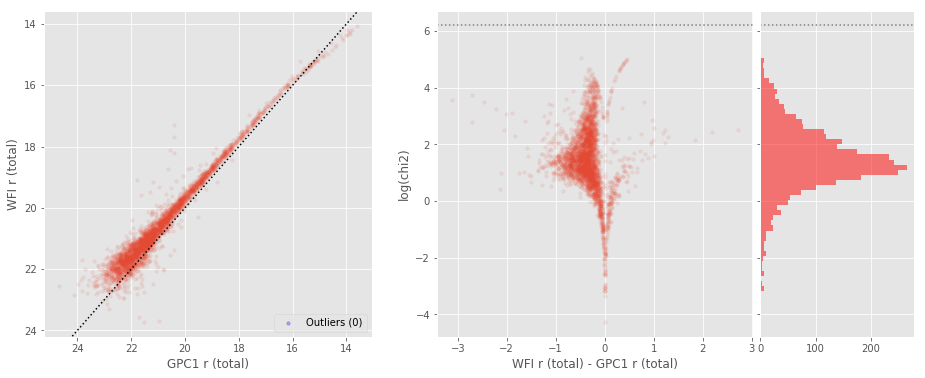

DECam r (aperture) - GPC1 r (aperture) (160150 sources):
- Median: 0.18
- Median Absolute Deviation: 0.29
- 1% percentile: -1.5988021278381348
- 99% percentile: 1.172303848266603
Outliers separation: log(chi2) = 7.13
Number of outliers: 0



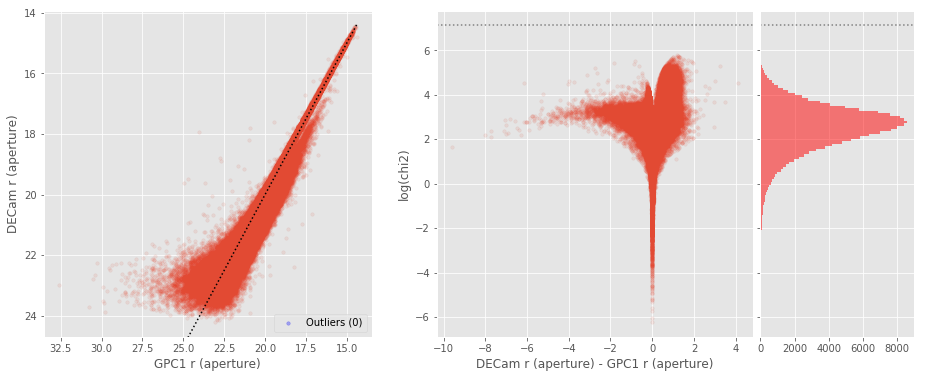

DECam r (total) - GPC1 r (total) (147429 sources):
- Median: -0.18
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9400785064697266
- 99% percentile: 2.704162712097168
Outliers separation: log(chi2) = 5.59
Number of outliers: 2088



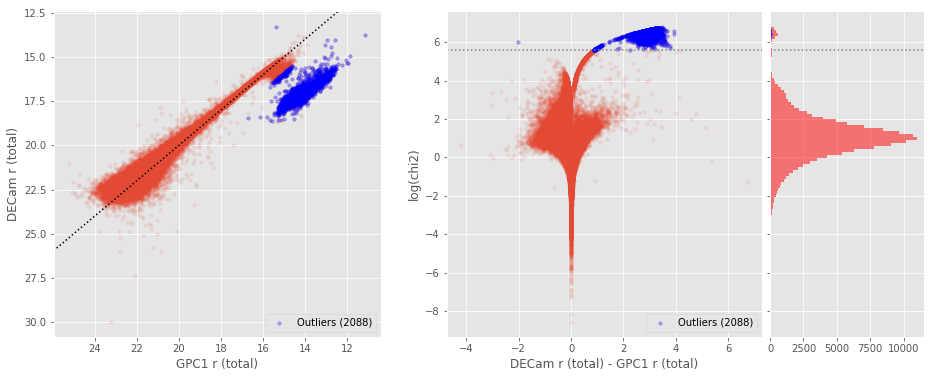

WFI r (aperture) - OmegaCAM r (aperture) (2613 sources):
- Median: 0.10
- Median Absolute Deviation: 0.13
- 1% percentile: -0.3106356048583985
- 99% percentile: 0.7375316619873049
Outliers separation: log(chi2) = 5.60
Number of outliers: 0



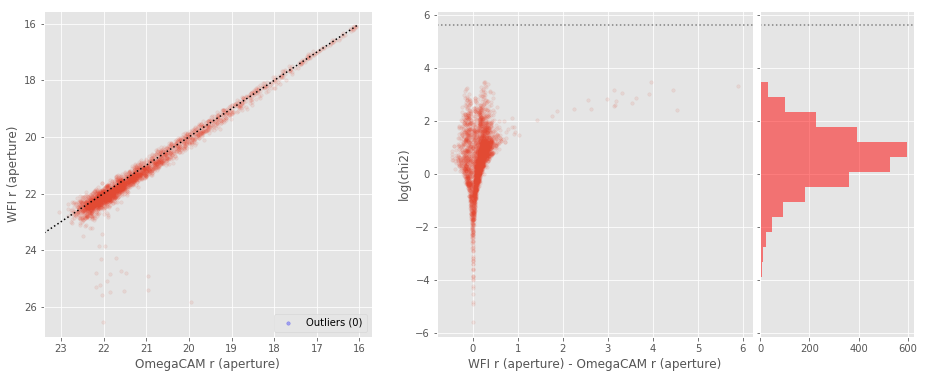

WFI r (total) - OmegaCAM r (total) (2793 sources):
- Median: -0.25
- Median Absolute Deviation: 0.15
- 1% percentile: -1.2212352752685547
- 99% percentile: 0.9211926269531243
Outliers separation: log(chi2) = 4.91
Number of outliers: 11



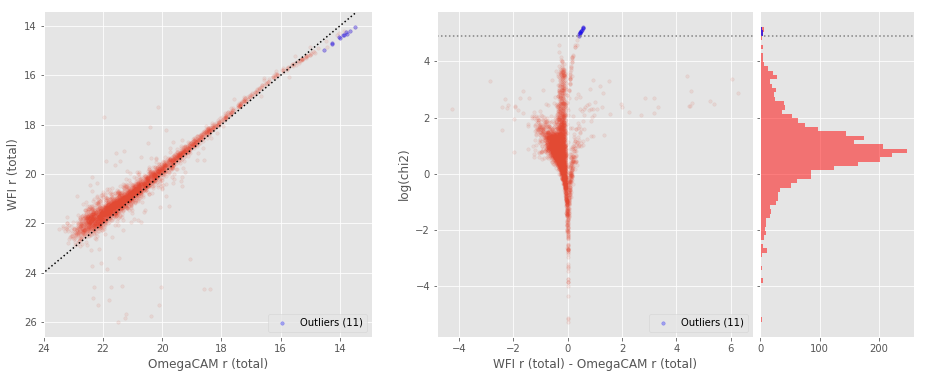

DECam r (aperture) - OmegaCAM r (aperture) (166849 sources):
- Median: 0.00
- Median Absolute Deviation: 0.09
- 1% percentile: -0.3532426452636719
- 99% percentile: 0.44755035400390497
Outliers separation: log(chi2) = 5.25
Number of outliers: 9



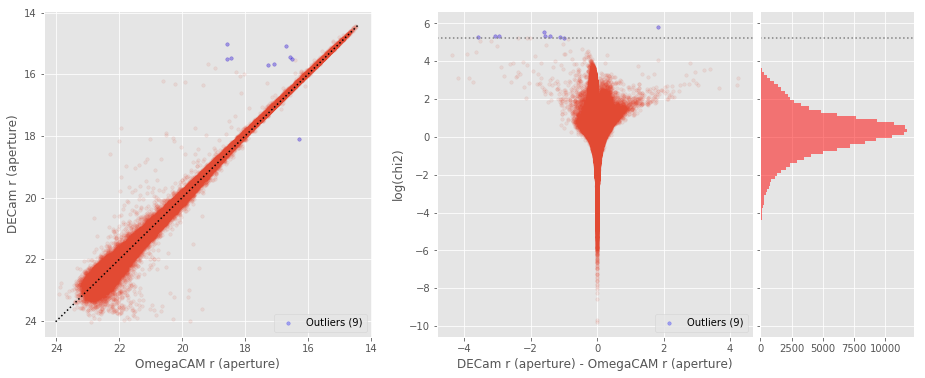

DECam r (total) - OmegaCAM r (total) (171233 sources):
- Median: -0.10
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0039896392822265
- 99% percentile: 2.9235151672363267
Outliers separation: log(chi2) = 4.82
Number of outliers: 3069



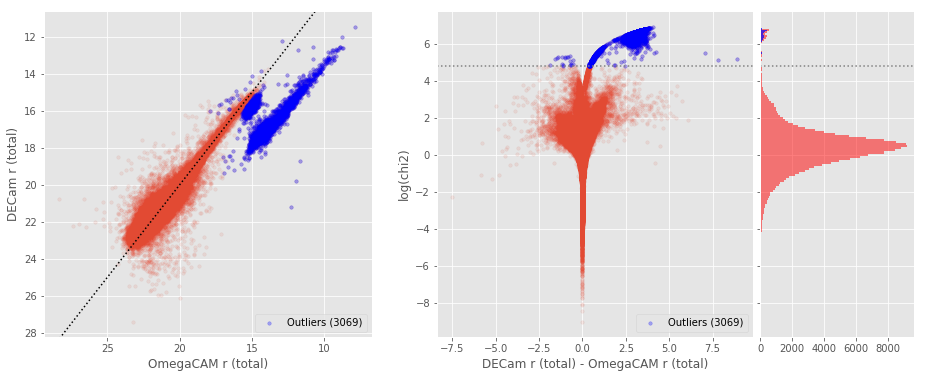

DECam r (aperture) - WFI r (aperture) (10146 sources):
- Median: -0.08
- Median Absolute Deviation: 0.06
- 1% percentile: -0.5471199035644532
- 99% percentile: 0.16690835952758754
Outliers separation: log(chi2) = 5.32
Number of outliers: 0



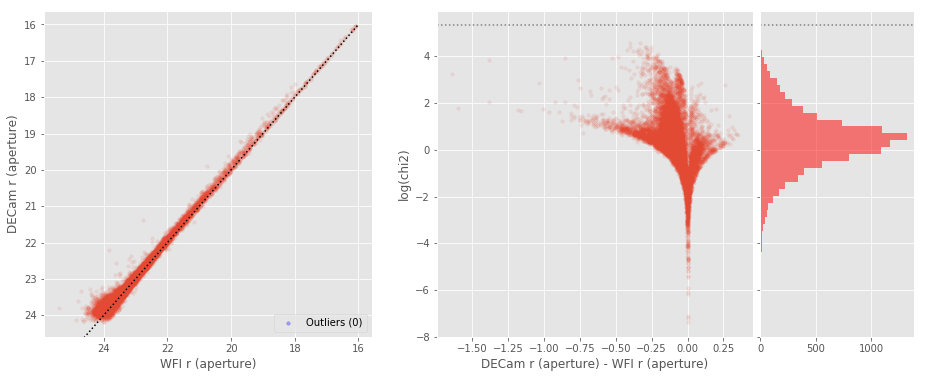

DECam r (total) - WFI r (total) (18970 sources):
- Median: 0.20
- Median Absolute Deviation: 0.13
- 1% percentile: -0.5270254707336426
- 99% percentile: 1.3434642982482918
Outliers separation: log(chi2) = 4.51
Number of outliers: 48



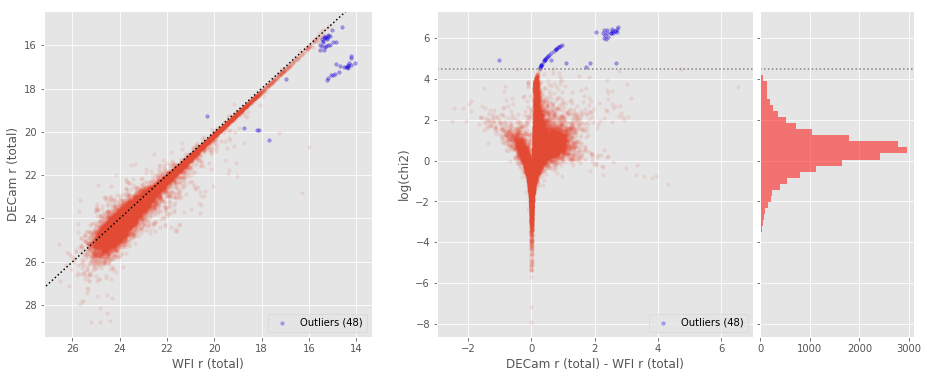

OmegaCAM i (aperture) - GPC1 i (aperture) (131898 sources):
- Median: 0.17
- Median Absolute Deviation: 0.19
- 1% percentile: -0.6653031349182128
- 99% percentile: 0.9848984146118164
Outliers separation: log(chi2) = 6.00
Number of outliers: 171



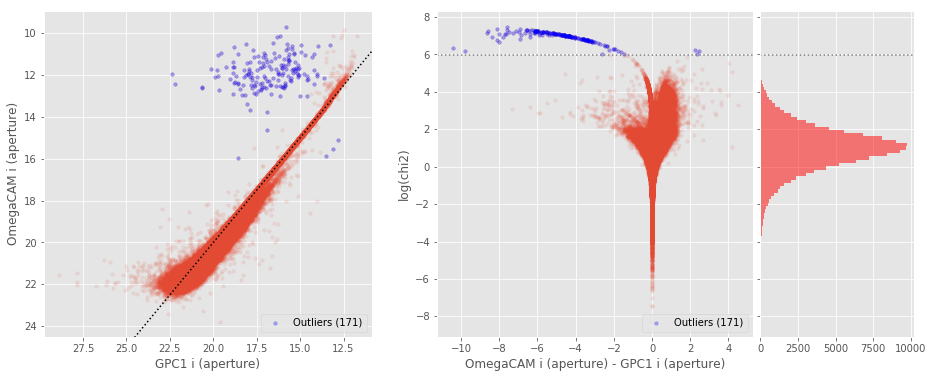

OmegaCAM i (total) - GPC1 i (total) (129615 sources):
- Median: -0.05
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8083547973632812
- 99% percentile: 0.8688420867919927
Outliers separation: log(chi2) = 5.12
Number of outliers: 110



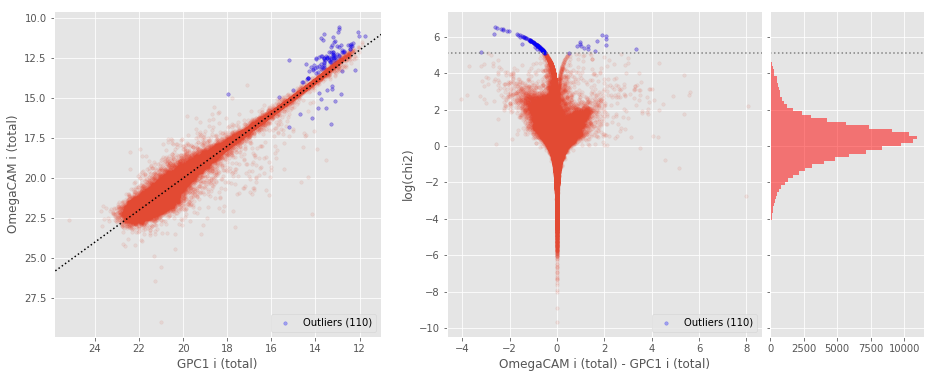

WFI i (aperture) - GPC1 i (aperture) (3382 sources):
- Median: 0.15
- Median Absolute Deviation: 0.32
- 1% percentile: -1.1307513236999511
- 99% percentile: 1.2702113151550296
Outliers separation: log(chi2) = 7.10
Number of outliers: 0



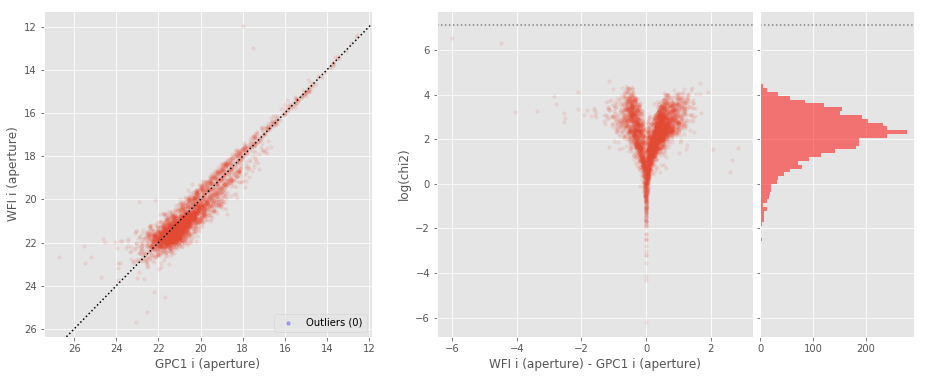

No sources have both GPC1 i (total) and WFI i (total) values.

DECam i (aperture) - GPC1 i (aperture) (162782 sources):
- Median: 0.26
- Median Absolute Deviation: 0.31
- 1% percentile: -0.7910162544250487
- 99% percentile: 1.266036949157715
Outliers separation: log(chi2) = 7.35
Number of outliers: 0



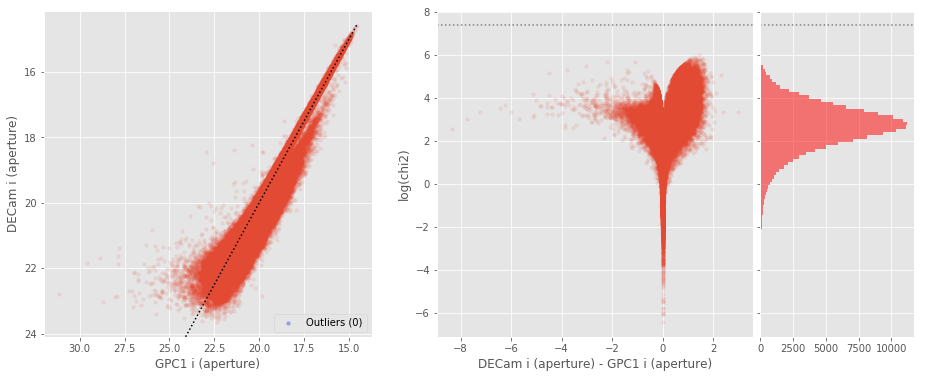

DECam i (total) - GPC1 i (total) (163007 sources):
- Median: -0.17
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7834041595458985
- 99% percentile: 3.1839383888244632
Outliers separation: log(chi2) = 5.62
Number of outliers: 2625



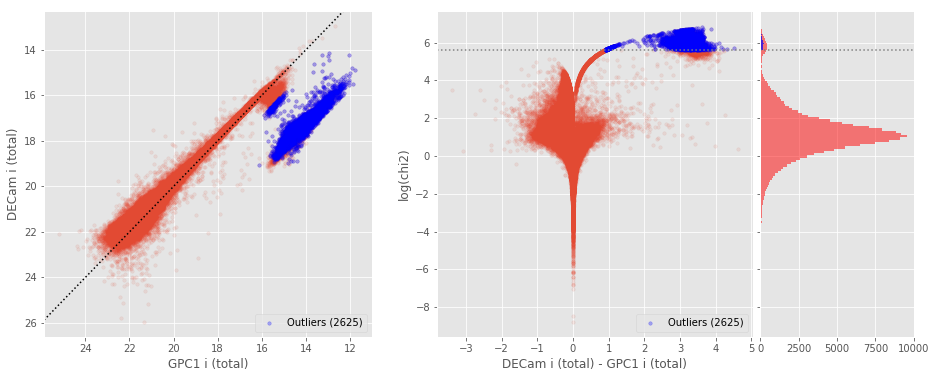

WFI i (aperture) - OmegaCAM i (aperture) (3389 sources):
- Median: -0.00
- Median Absolute Deviation: 0.16
- 1% percentile: -0.7342316436767578
- 99% percentile: 0.5792187499999985
Outliers separation: log(chi2) = 6.33
Number of outliers: 0



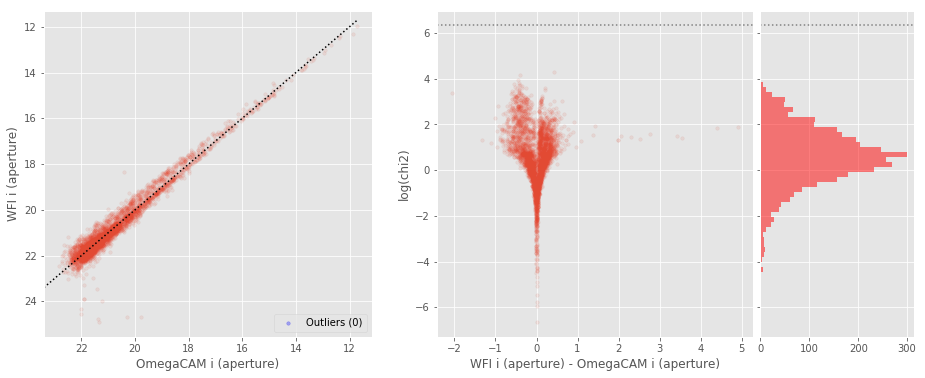

No sources have both OmegaCAM i (total) and WFI i (total) values.

DECam i (aperture) - OmegaCAM i (aperture) (144428 sources):
- Median: 0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -0.3935373687744141
- 99% percentile: 0.5509270668029798
Outliers separation: log(chi2) = 5.76
Number of outliers: 0



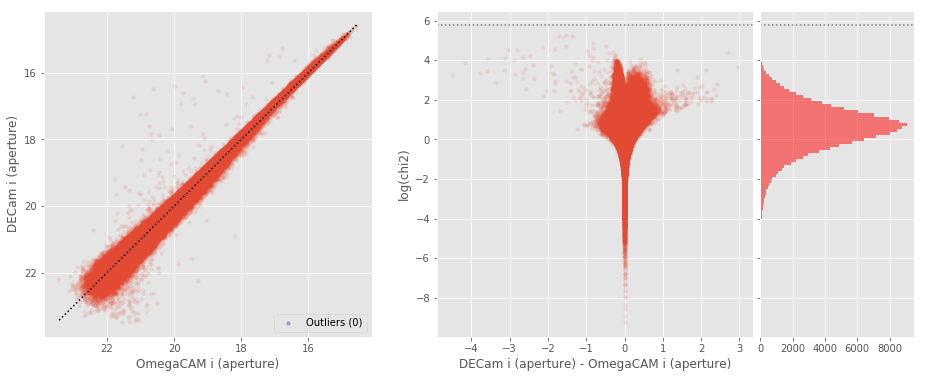

DECam i (total) - OmegaCAM i (total) (149172 sources):
- Median: -0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -1.020422763824463
- 99% percentile: 3.4286825561523466
Outliers separation: log(chi2) = 4.94
Number of outliers: 3942



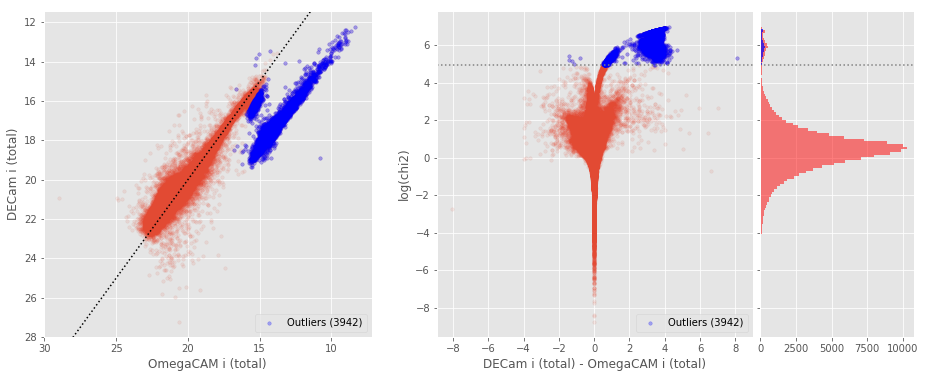

DECam i (aperture) - WFI i (aperture) (9198 sources):
- Median: 0.11
- Median Absolute Deviation: 0.11
- 1% percentile: -0.49341890335083005
- 99% percentile: 0.5684973335266115
Outliers separation: log(chi2) = 5.46
Number of outliers: 0



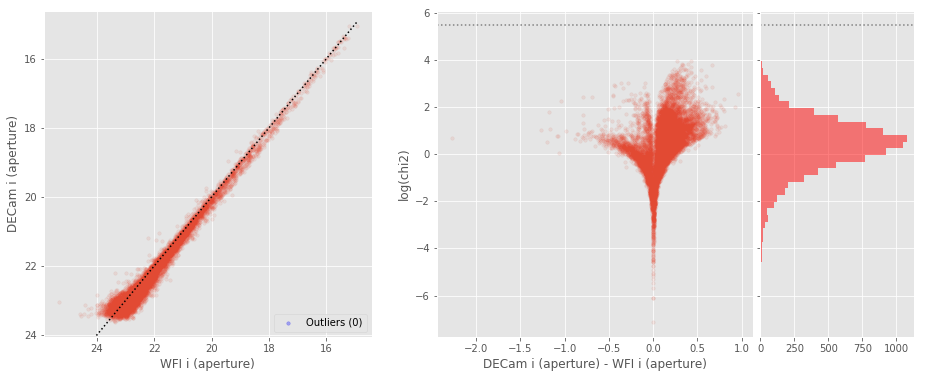

No sources have both WFI i (total) and DECam i (total) values.

OmegaCAM z (aperture) - GPC1 z (aperture) (81947 sources):
- Median: -0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -0.6441340255737305
- 99% percentile: 0.8065197753906236
Outliers separation: log(chi2) = 6.75
Number of outliers: 62



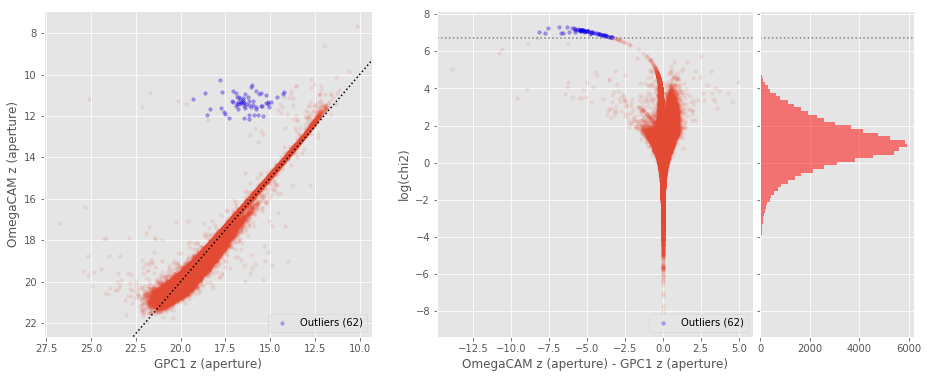

OmegaCAM z (total) - GPC1 z (total) (80924 sources):
- Median: -0.17
- Median Absolute Deviation: 0.11
- 1% percentile: -0.795020923614502
- 99% percentile: 0.6282771301269532
Outliers separation: log(chi2) = 6.10
Number of outliers: 12



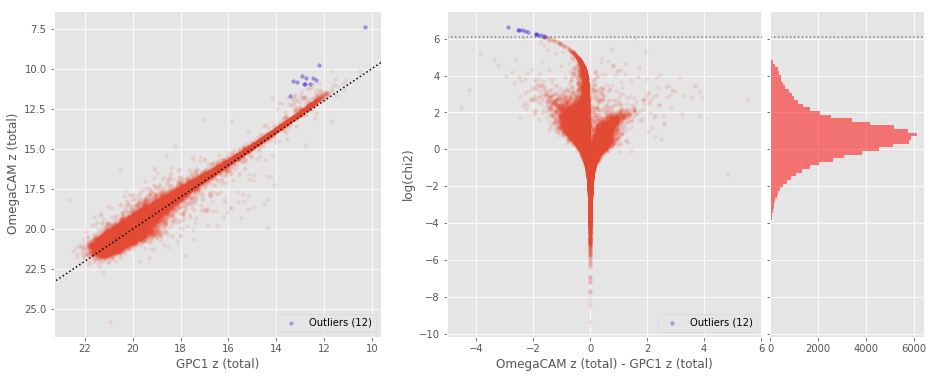

DECam z (aperture) - GPC1 z (aperture) (162166 sources):
- Median: 0.25
- Median Absolute Deviation: 0.30
- 1% percentile: -0.8205214500427246
- 99% percentile: 1.2088318824768067
Outliers separation: log(chi2) = 6.94
Number of outliers: 0



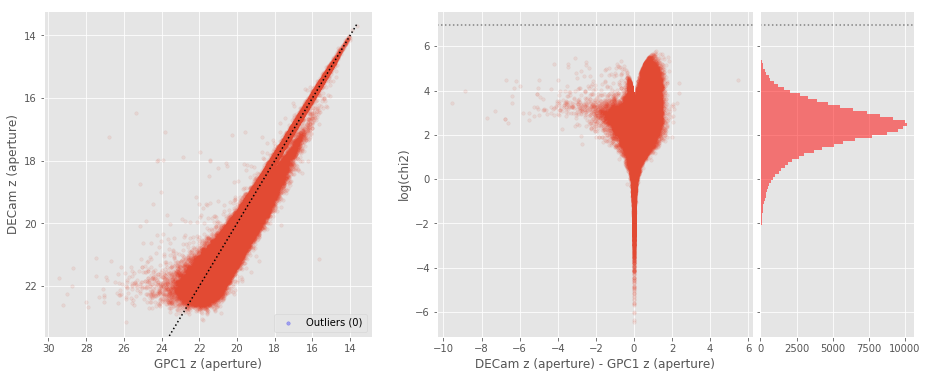

DECam z (total) - GPC1 z (total) (159815 sources):
- Median: -0.18
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8591748046875
- 99% percentile: 2.946851081848142
Outliers separation: log(chi2) = 5.72
Number of outliers: 1209



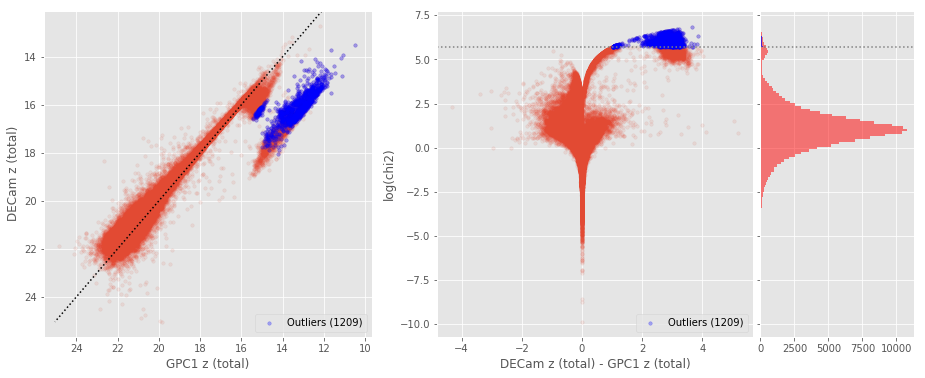

VISTA z (aperture) - GPC1 z (aperture) (22205 sources):
- Median: 0.12
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8292744445800782
- 99% percentile: 0.7439142608642577
Outliers separation: log(chi2) = 7.17
Number of outliers: 0



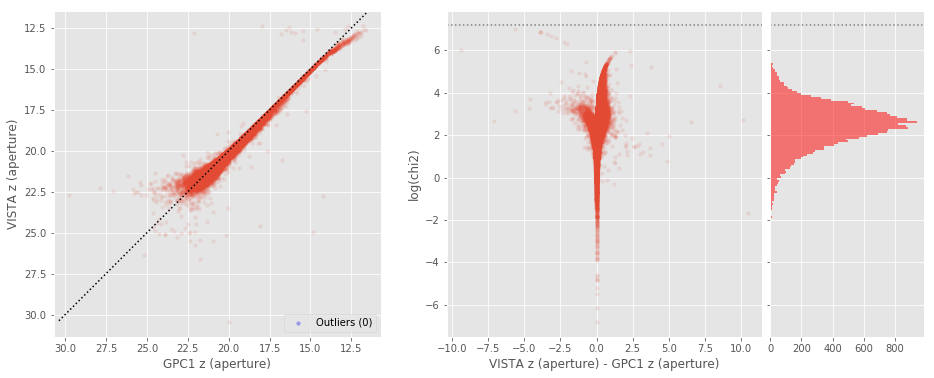

VISTA z (total) - GPC1 z (total) (21418 sources):
- Median: -0.13
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7600824356079102
- 99% percentile: 0.5232796287536614
Outliers separation: log(chi2) = 5.70
Number of outliers: 4



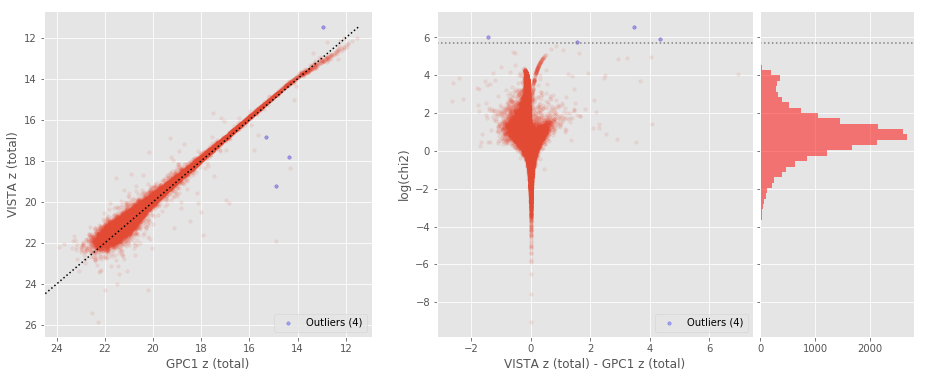

DECam z (aperture) - OmegaCAM z (aperture) (80882 sources):
- Median: 0.11
- Median Absolute Deviation: 0.10
- 1% percentile: -0.23049186706542965
- 99% percentile: 0.6151915931701665
Outliers separation: log(chi2) = 5.70
Number of outliers: 0



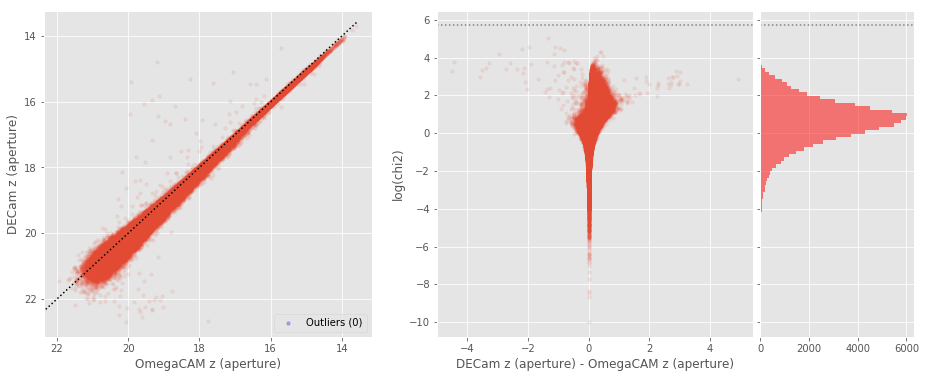

DECam z (total) - OmegaCAM z (total) (84584 sources):
- Median: 0.01
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8286170196533202
- 99% percentile: 3.3931300640106197
Outliers separation: log(chi2) = 4.96
Number of outliers: 3249



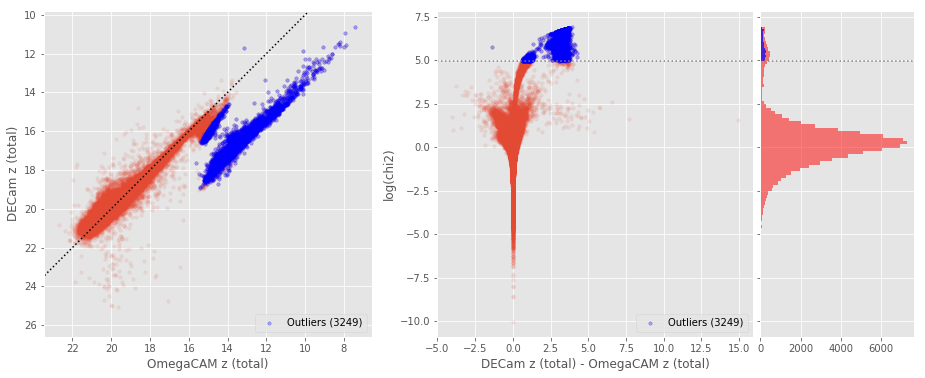

VISTA z (aperture) - OmegaCAM z (aperture) (10662 sources):
- Median: 0.16
- Median Absolute Deviation: 0.09
- 1% percentile: -0.33622013092041014
- 99% percentile: 0.8982582283020007
Outliers separation: log(chi2) = 7.79
Number of outliers: 0



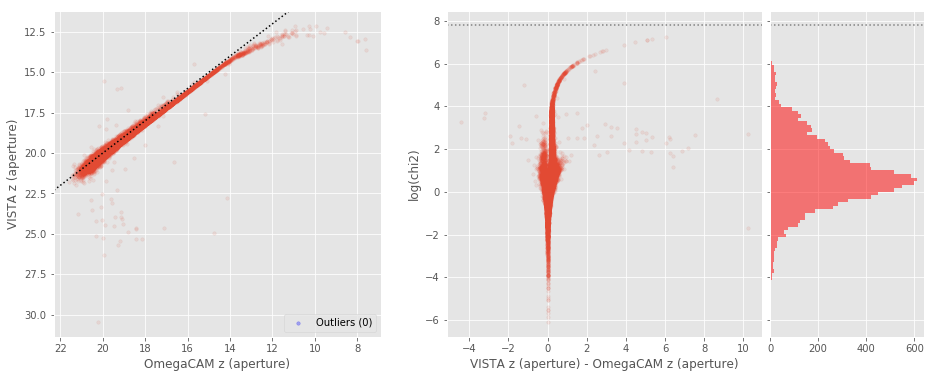

VISTA z (total) - OmegaCAM z (total) (10662 sources):
- Median: 0.05
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8182351684570313
- 99% percentile: 0.7913664817810039
Outliers separation: log(chi2) = 5.06
Number of outliers: 87



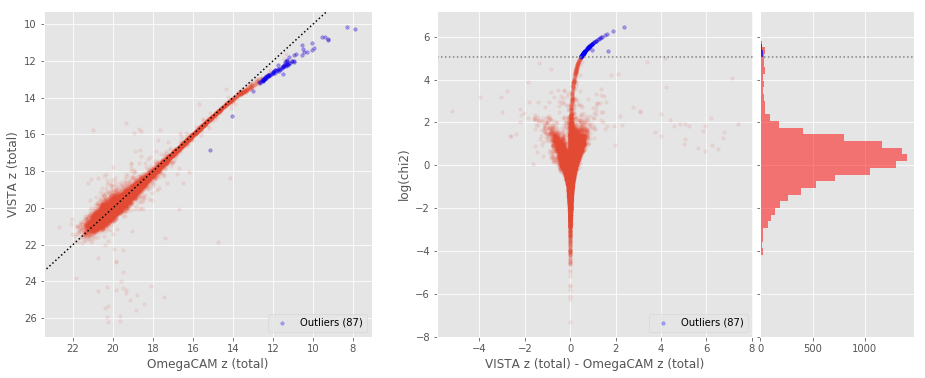

VISTA z (aperture) - DECam z (aperture) (47551 sources):
- Median: -0.09
- Median Absolute Deviation: 0.21
- 1% percentile: -0.7185096740722656
- 99% percentile: 0.5554208755493164
Outliers separation: log(chi2) = 7.37
Number of outliers: 0



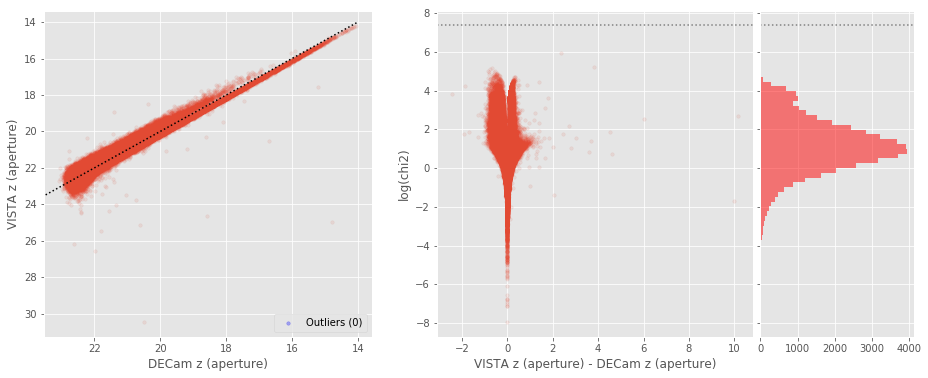

VISTA z (total) - DECam z (total) (130331 sources):
- Median: 0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -2.0058786392211916
- 99% percentile: 1.170486259460449
Outliers separation: log(chi2) = 4.19
Number of outliers: 664



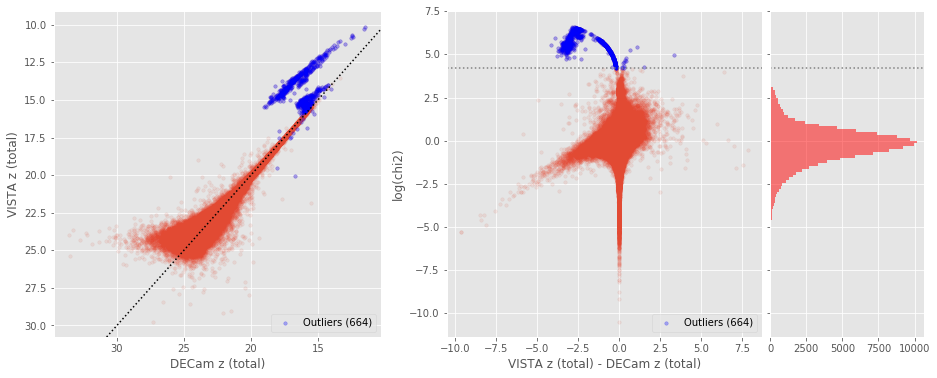

DECam y (aperture) - GPC1 y (aperture) (123183 sources):
- Median: 0.20
- Median Absolute Deviation: 0.25
- 1% percentile: -1.3568295669555663
- 99% percentile: 1.2080453109741205
Outliers separation: log(chi2) = 6.51
Number of outliers: 4



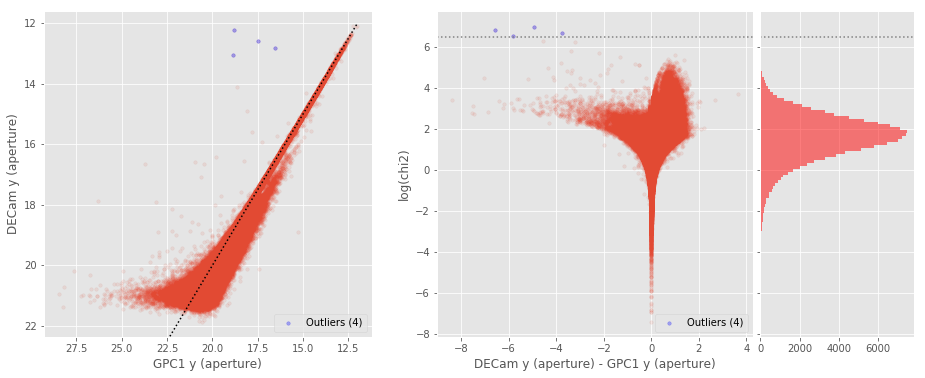

DECam y (total) - GPC1 y (total) (118893 sources):
- Median: -0.12
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0285805511474608
- 99% percentile: 0.9867723846435557
Outliers separation: log(chi2) = 5.19
Number of outliers: 616



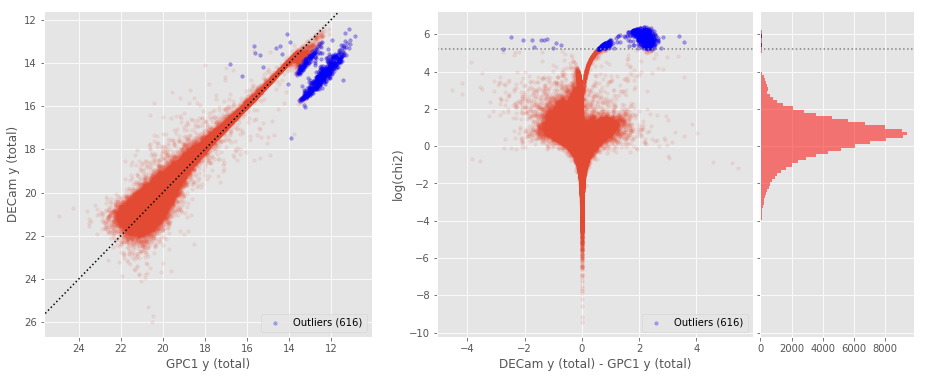

VISTA y (aperture) - GPC1 y (aperture) (65530 sources):
- Median: 0.09
- Median Absolute Deviation: 0.16
- 1% percentile: -1.9528142738342287
- 99% percentile: 1.0623823356628417
Outliers separation: log(chi2) = 7.10
Number of outliers: 0



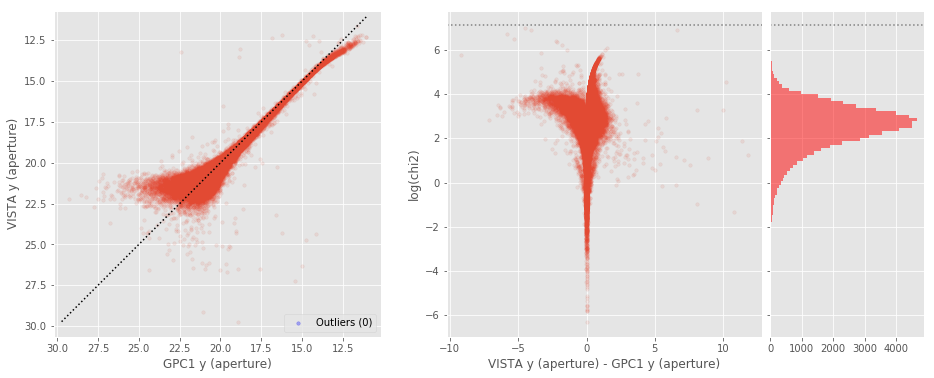

VISTA y (total) - GPC1 y (total) (48329 sources):
- Median: -0.19
- Median Absolute Deviation: 0.15
- 1% percentile: -1.0352452850341796
- 99% percentile: 0.7106719207763674
Outliers separation: log(chi2) = 5.81
Number of outliers: 1



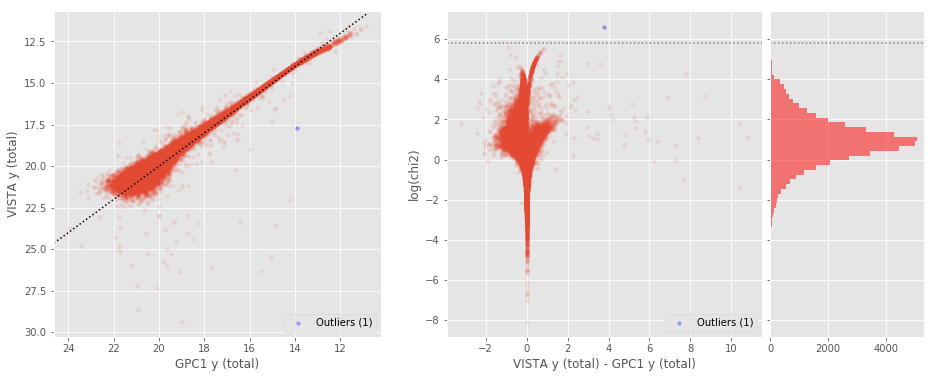

VISTA y (aperture) - DECam y (aperture) (51855 sources):
- Median: -0.14
- Median Absolute Deviation: 0.21
- 1% percentile: -0.8559646606445312
- 99% percentile: 0.4183232116699216
Outliers separation: log(chi2) = 7.05
Number of outliers: 0



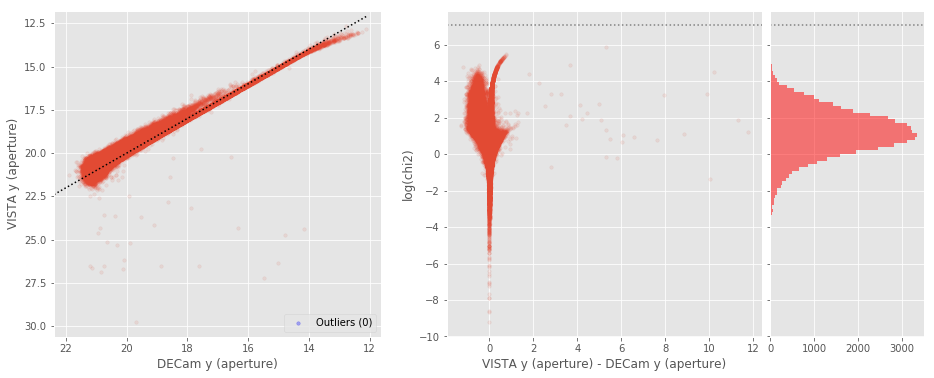

VISTA y (total) - DECam y (total) (316675 sources):
- Median: -0.04
- Median Absolute Deviation: 0.38
- 1% percentile: -3.277728614807129
- 99% percentile: 1.957741127014161
Outliers separation: log(chi2) = 4.66
Number of outliers: 471



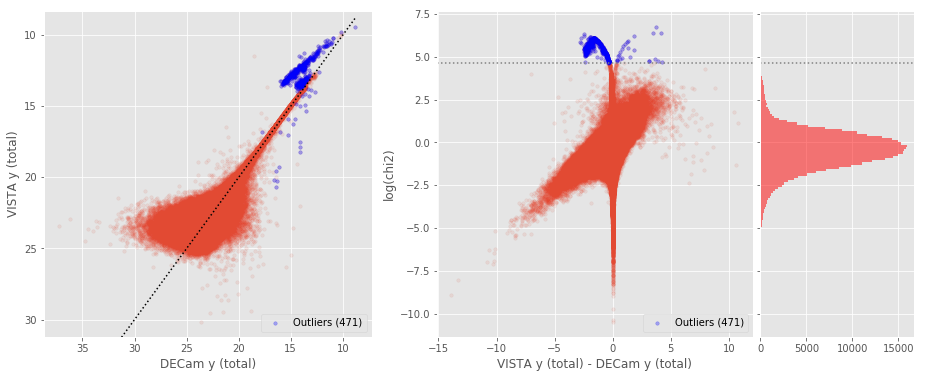

In [15]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "gpc1_g" and basecol2 == "omegacam_g":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))
        
plt.close() 
plt.close()
plt.close()
plt.close()

## 4. Aperture correction issues

In [16]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    print(len(x[zoom]))
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

WFI u (aperture) - OmegaCAM u (aperture):
139


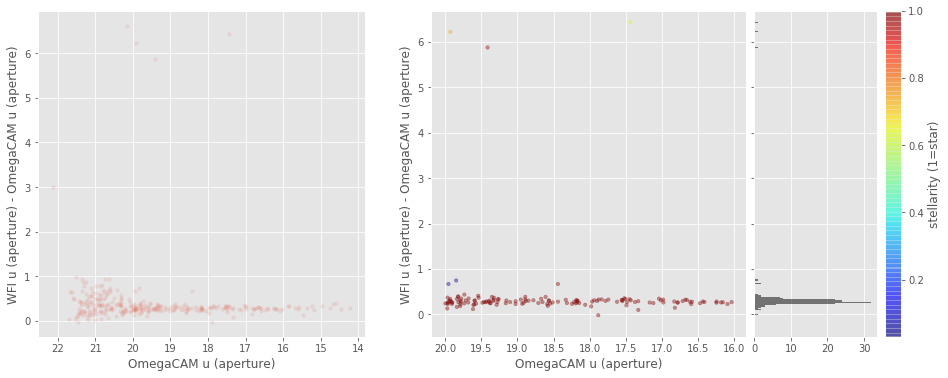

OmegaCAM g (aperture) - GPC1 g (aperture):
17829


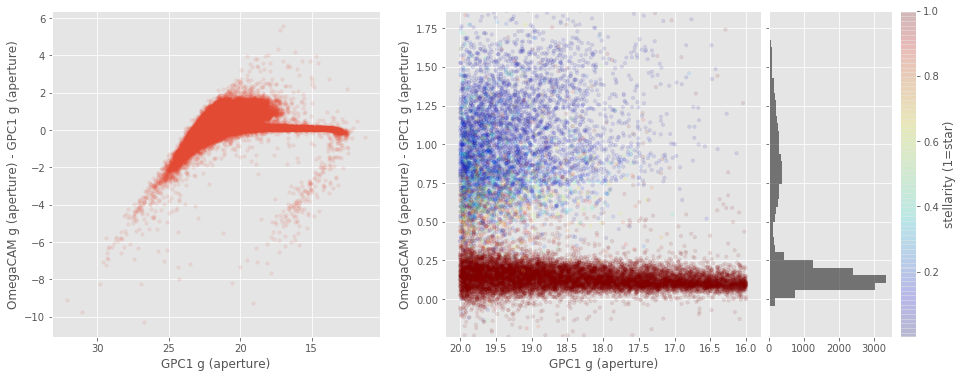

DECam g (aperture) - GPC1 g (aperture):
18173


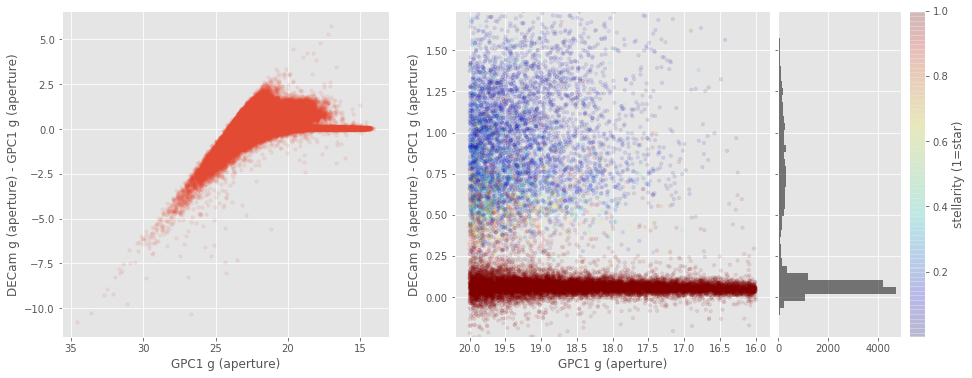

DECam g (aperture) - OmegaCAM g (aperture):
13175


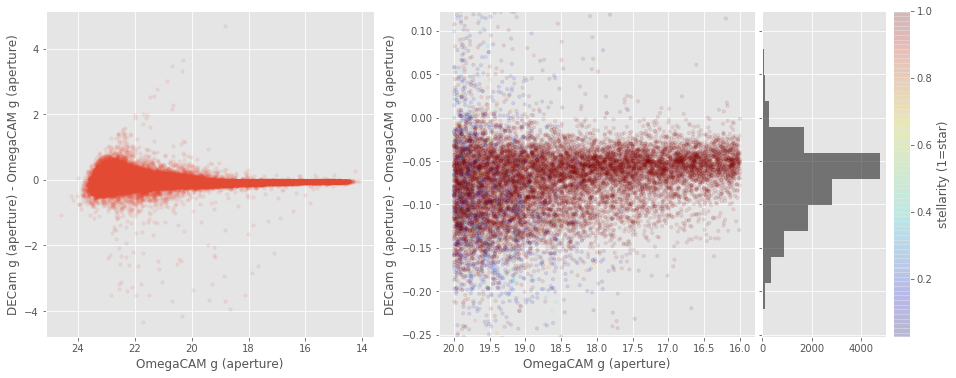

OmegaCAM r (aperture) - GPC1 r (aperture):
30074


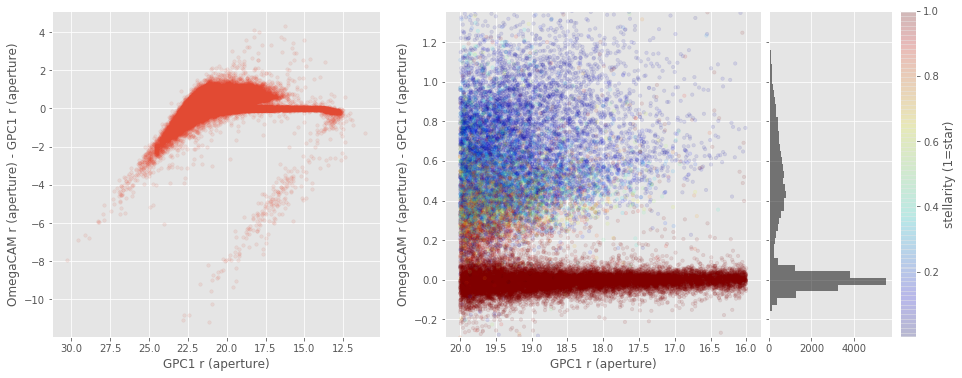

WFI r (aperture) - GPC1 r (aperture):
527


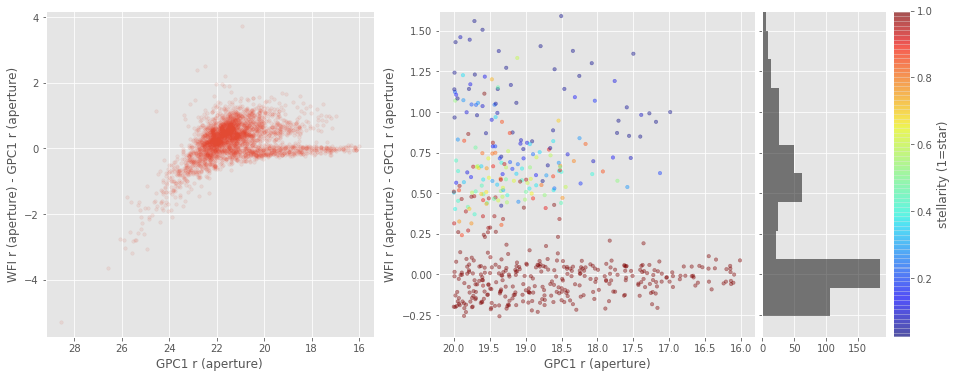

DECam r (aperture) - GPC1 r (aperture):
30594


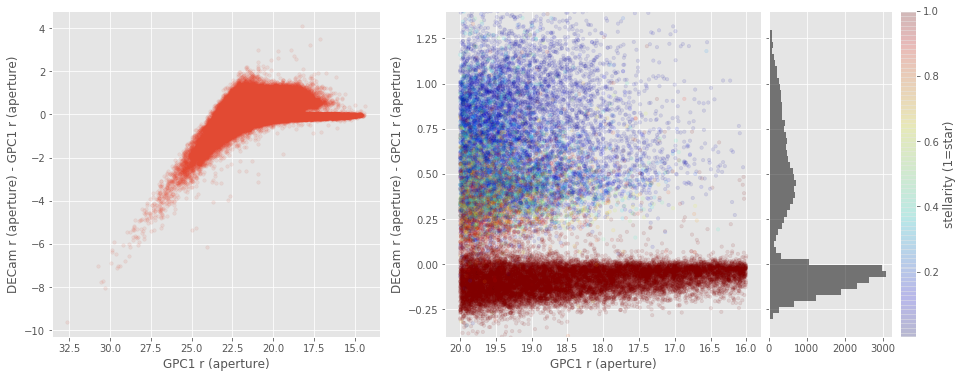

WFI r (aperture) - OmegaCAM r (aperture):
444


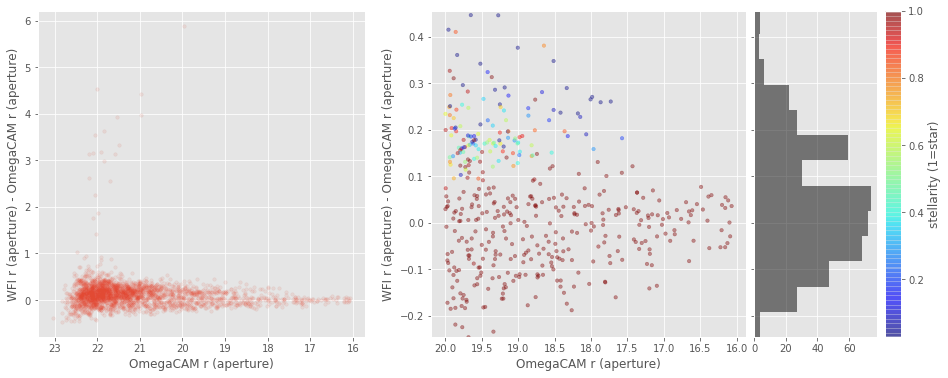

DECam r (aperture) - OmegaCAM r (aperture):
24088


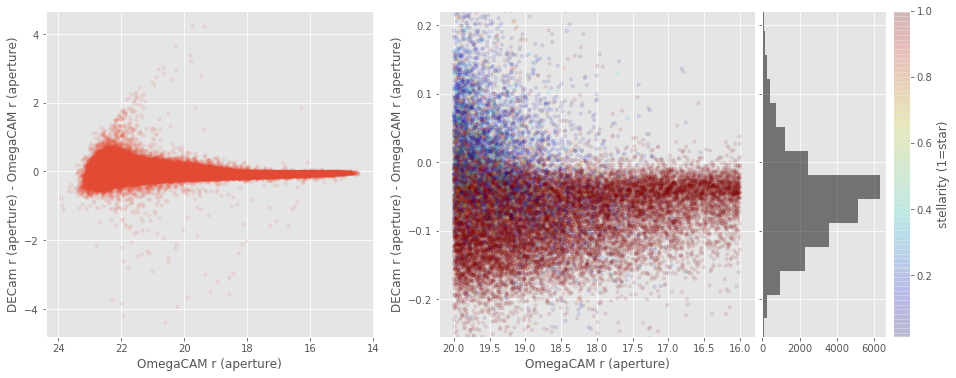

DECam r (aperture) - WFI r (aperture):
435


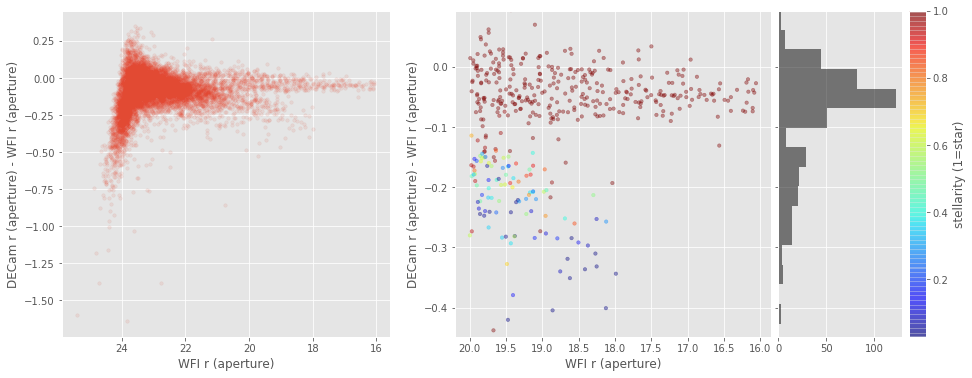

OmegaCAM i (aperture) - GPC1 i (aperture):
44584


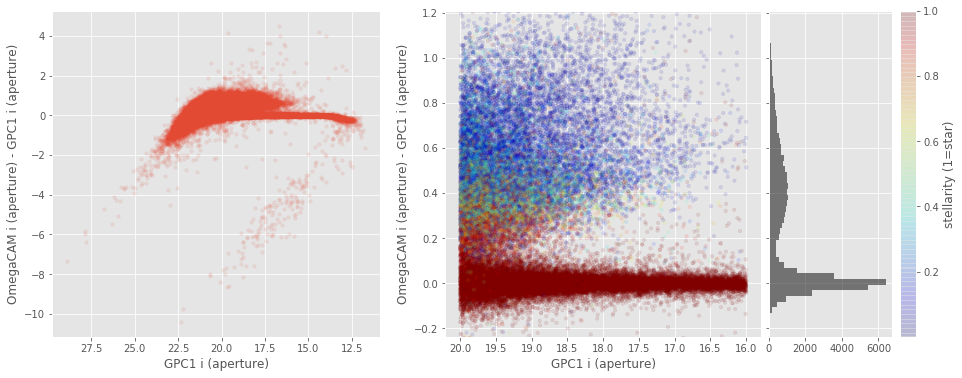

WFI i (aperture) - GPC1 i (aperture):
850


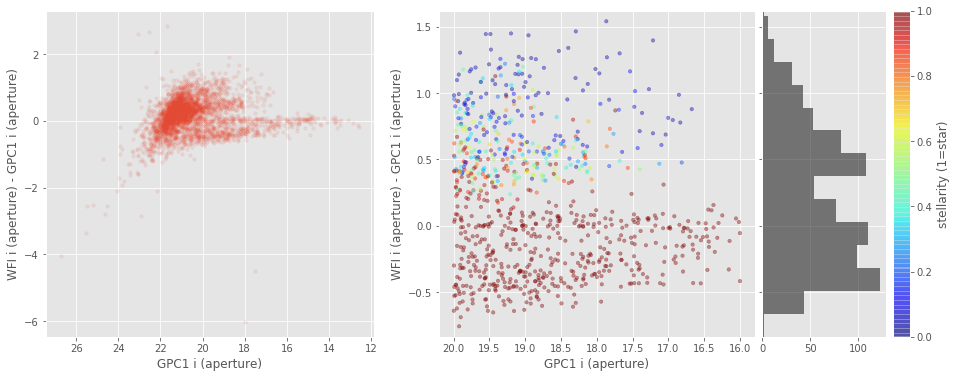

DECam i (aperture) - GPC1 i (aperture):
45174


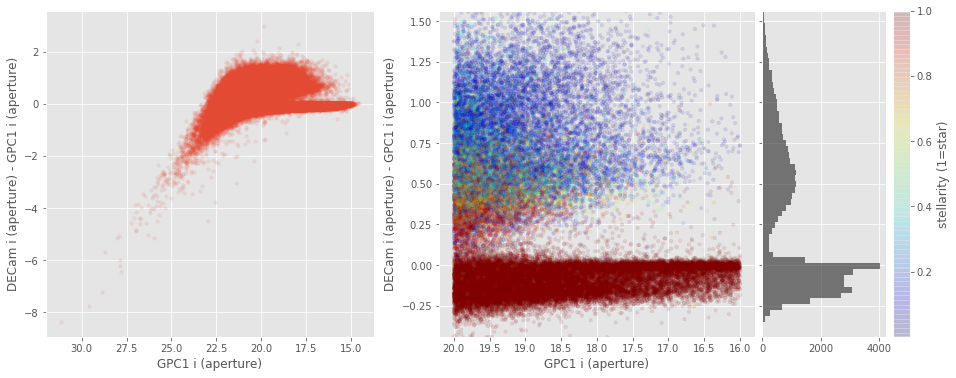

WFI i (aperture) - OmegaCAM i (aperture):
667


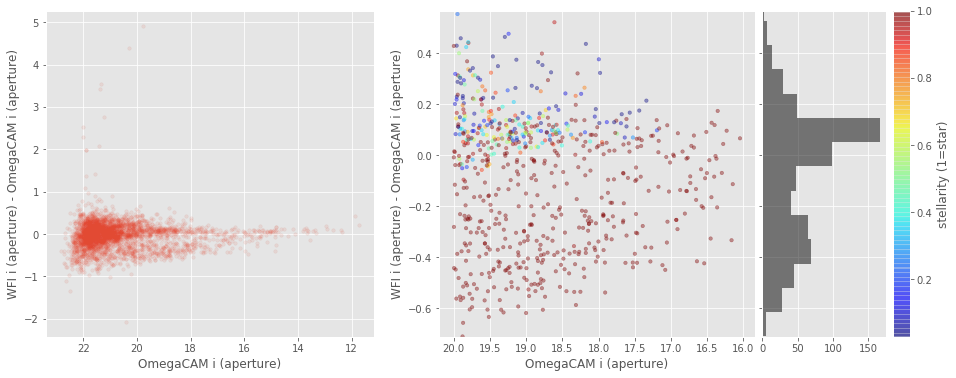

DECam i (aperture) - OmegaCAM i (aperture):
36236


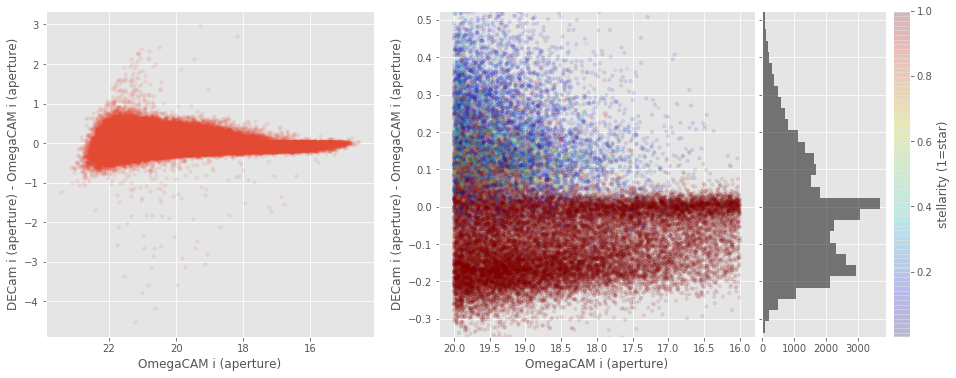

DECam i (aperture) - WFI i (aperture):
724


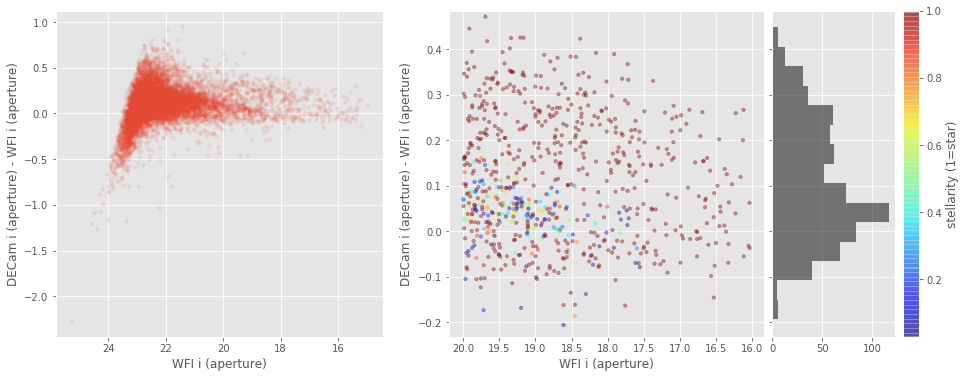

OmegaCAM z (aperture) - GPC1 z (aperture):
51961


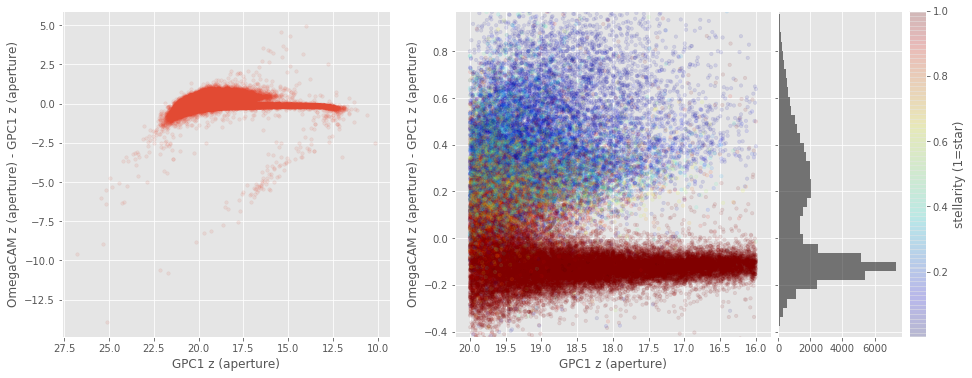

DECam z (aperture) - GPC1 z (aperture):
55571


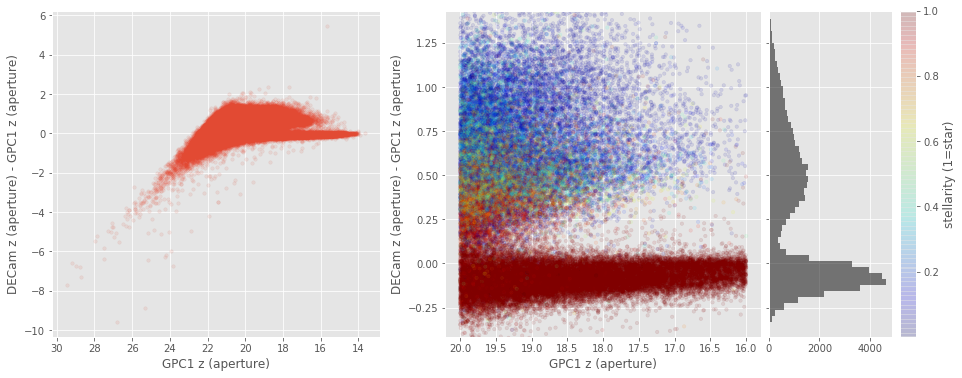

VISTA z (aperture) - GPC1 z (aperture):
7068


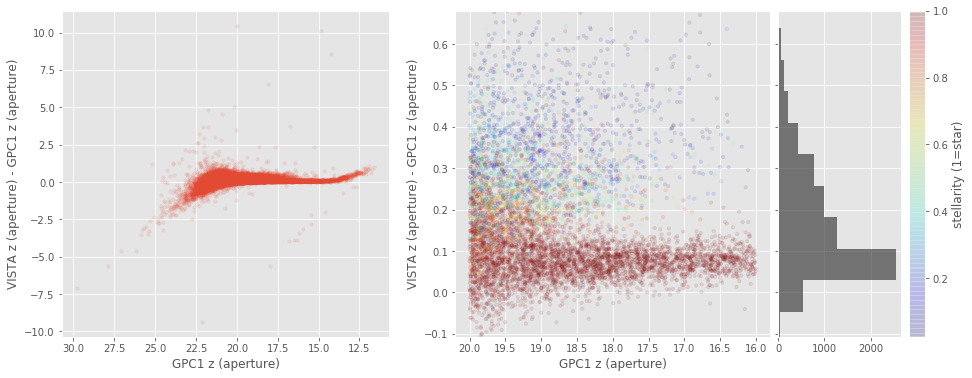

DECam z (aperture) - OmegaCAM z (aperture):
48639


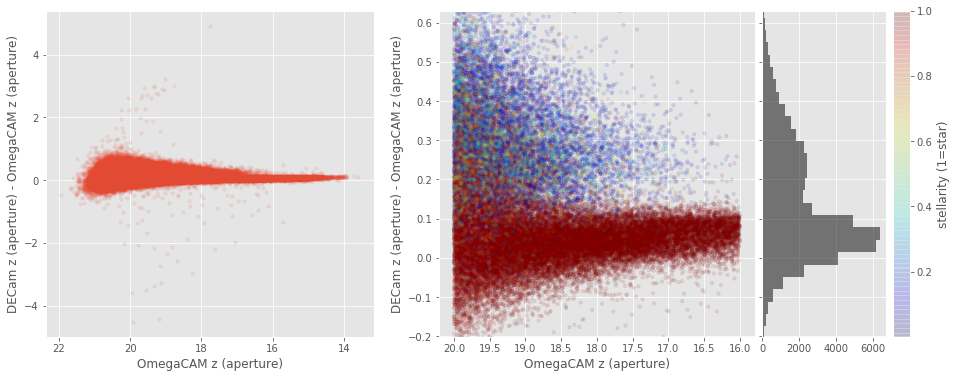

VISTA z (aperture) - OmegaCAM z (aperture):
6270


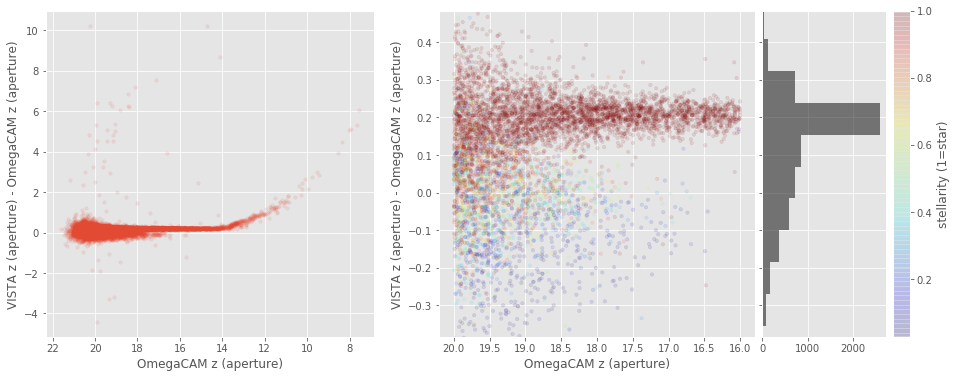

VISTA z (aperture) - DECam z (aperture):
5661


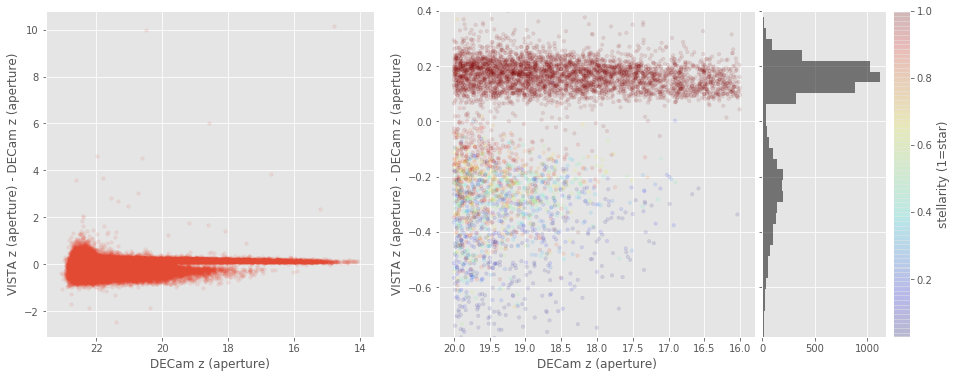

DECam y (aperture) - GPC1 y (aperture):
63881


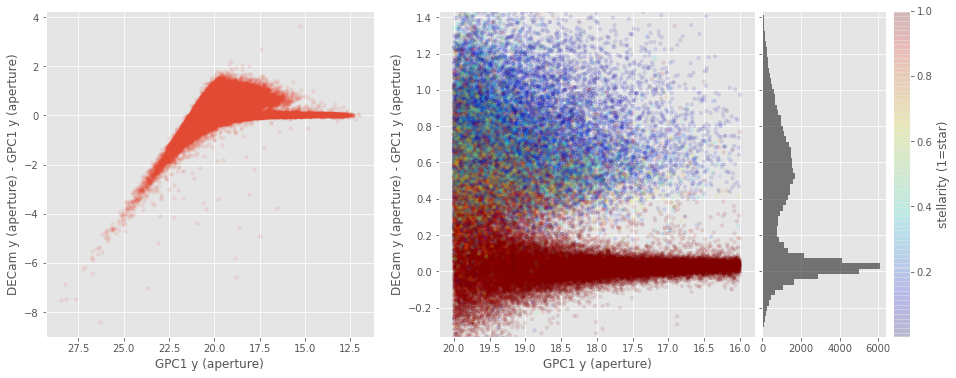

VISTA y (aperture) - GPC1 y (aperture):
25106


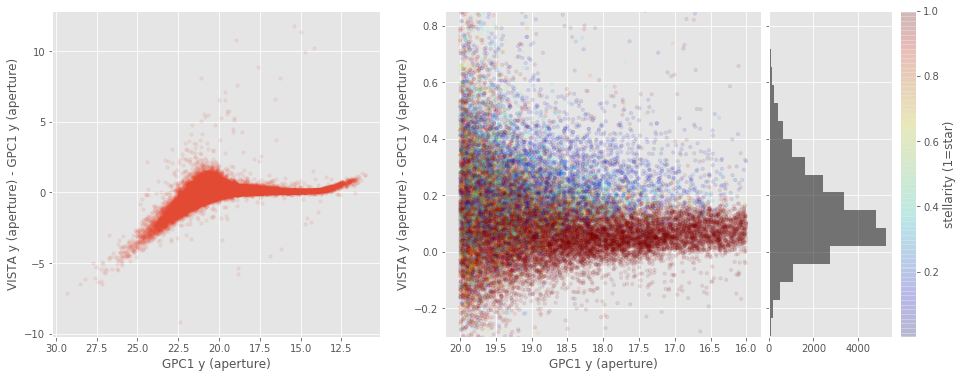

VISTA y (aperture) - DECam y (aperture):
18373


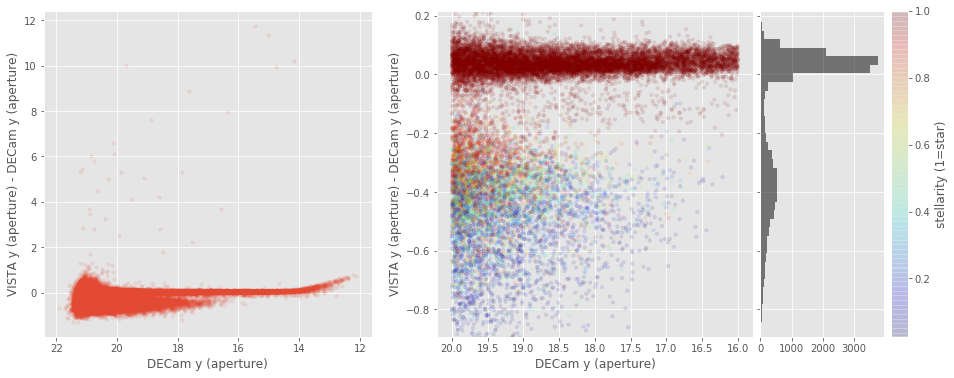

In [17]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if basecol1 == "gpc1_z" and basecol2 == "omegacam_z":
            savefig = True
        else:
            savefig = False
            
        
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
